# Header

In [1]:
from utils import *
import pyreadr
from sklearn.neighbors import NearestCentroid
from scipy.stats import zscore
from statannotations.Annotator import Annotator

import puree

def join_with_linebreaks(words):
    modified_words = [word if i%3 != 0 and (i<len(words)-1) else word + '\n' for i, word in enumerate(words)]
    
#     modified_words = [word if i==0 else word.capitalize() for i,word in enumerate(modified_words)]
    
    return ' '.join(modified_words)

In [5]:
sns.set(style='white', font_scale=1)
plt.rcParams['figure.dpi'] = 300  # set default dpi to 300

In [3]:
import session_info

session_info.show()

# Annotation

## Classifier

Used TCGA 60g ILC classifier, to test on TCGA+ILC samples, then get results of ILC

In [3]:
genes_cls = np.loadtxt('../data/geneset/ILC_60g_classifier', dtype='object')
genes_cls

array(['ADH1B', 'ADH1C', 'ALDH1L1', 'AQP7P1', 'AQPEP', 'BBOX1',
       'C11orf92', 'C2orf40', 'CAPN6', 'CD300LG', 'CHRDL1', 'CLDN19',
       'CNTFR', 'COL17A1', 'CRYAB', 'DLK2', 'EFCAB1', 'FABP4', 'FAT2',
       'FFAR3', 'FIGF', 'G0S2', 'GFAP', 'GPX3', 'GRIA4', 'HIF3A', 'ITIH5',
       'KCNIP2', 'KLB', 'KLHL13', 'KLK5', 'KY', 'LGR6', 'LIPE',
       'LOC339524', 'LPL', 'MEOX1', 'MIA', 'NKPD1', 'PAK7', 'PCOLCE2',
       'PDE3B', 'PFKFB1', 'PI16', 'PIK3C2G', 'PLP1', 'RDH5', 'S100B',
       'SCARA5', 'SCN4A', 'SFRP1', 'SLC19A3', 'SLC27A6', 'SOX10', 'STAC2',
       'STX11', 'TMEM132C', 'TNMD', 'TNXB', 'TP63'], dtype=object)

In [4]:
# copied from lab storage '/Users/chelseachen/Library/CloudStorage/OneDrive-UniversityofPittsburgh/01_projects/publicds/database/tcga2015/brcaTCGAtpm_log2_normalized.Rda'

result = pyreadr.read_r('../data/tcga/brcaTCGAtpm_log2_normalized.Rda') # also works for Rds, rda
print(result.keys()) 

df = result["brcaTCGAtpm_log2_primaries_unique"] # extract the pandas data frame for object df1
df.columns = [x.replace('-','.') for x in df.columns]
df

odict_keys(['brcaTCGAtpm_log2_primaries_unique'])


,TCGA.A2.A0T1,TCGA.A7.A3J0,TCGA.AO.A126,TCGA.E2.A14X,TCGA.A7.A13G,TCGA.AR.A0TP,TCGA.E2.A15S,TCGA.A2.A1FW,TCGA.HN.A2OB,TCGA.B6.A0I1,...,TCGA.A2.A0YJ,TCGA.A2.A0T4,TCGA.AR.A1AH,TCGA.E9.A1RG,TCGA.GM.A2DL,TCGA.A8.A09R,TCGA.AC.A5XU,TCGA.BH.A0C7,TCGA.BH.A1EW,TCGA.A7.A0DC
rownames,,,,,,,,,,,,,,,,,,,,,
1/2-SBSRNA4,0.971512,1.483925,1.799654,1.175543,1.727316,1.694600,1.913264,1.715662,1.683864,1.990262,...,0.818318,1.041237,2.569367,1.852545,0.762192,0.819616,2.007000,1.747929,2.009340,1.292417
A1BG,2.187267,4.692154,5.270712,2.052527,2.347300,3.687565,3.976585,1.178059,4.388214,1.867174,...,2.136823,4.230601,3.639508,4.836438,4.098058,3.882475,5.378554,3.264876,3.243704,1.703415
A1BG-AS1,1.088305,2.239740,1.339469,1.477005,1.446537,1.641211,1.653995,0.896992,2.034332,0.930462,...,1.105274,1.564294,1.627971,0.978918,1.443643,2.046607,2.537466,1.711902,1.835139,1.070816
A1CF,0.012056,0.000000,0.042037,0.068496,0.423666,0.020984,0.018107,0.071041,0.000000,0.123313,...,0.000000,0.008989,0.040295,0.012988,0.041422,0.042470,0.007396,0.049563,0.124387,0.074922
A2LD1,2.474746,2.847702,2.701373,2.863486,1.815953,2.489747,1.593369,1.737514,2.700987,1.307890,...,1.954546,2.658488,0.971385,1.550661,2.000779,3.229217,2.839542,4.474066,3.052560,1.100326
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZYG11B,3.569481,3.727197,3.341315,4.299792,4.934392,4.326777,4.513893,4.915622,4.164197,3.951605,...,4.218607,3.638686,5.436241,2.595333,3.825682,4.227062,3.097819,4.397482,4.661674,3.885324
ZYX,8.516777,7.259183,7.997580,7.836314,3.388212,9.333544,5.936066,6.293990,8.366593,7.344869,...,7.734706,7.465227,7.621721,7.437390,8.627606,7.930799,8.390976,7.341929,7.412067,2.305810
ZZEF1,3.712430,4.830454,2.784098,4.111526,4.608983,3.294119,4.433078,4.788771,4.115028,3.065764,...,4.487703,3.285337,3.340692,3.129546,3.398263,4.686970,4.372025,4.529173,4.520994,3.729563


In [5]:
tpm = pd.read_csv('../data/gex/tpm.csv', index_col=0)
log2tpm = np.log2(tpm+1)
log2tpm

,TP17_M605,TP18_M403,TP17_M383,TP18_M202,TP18_M355,TP17_M510,TP17_M802,TP17_M882,TP18_M329,TP17_M378,...,TP17_M559,TP18_M121,TP18_M278,TP18_M302,TP18_M372,TP18_M95,TP18_M251,TP17_M622,TP17_M899,TP17_M901
A1BG,2.913671,2.367799,2.715970,2.788187,2.530896,1.523219,2.424640,2.966162,2.000544,2.661342,...,2.193238,2.727257,3.008932,2.571447,2.264661,0.000000,2.826528,3.285835,2.463630,8.892400
A1BG-AS1,1.825807,2.810131,4.566757,2.855826,2.279173,2.398769,2.334086,3.224735,2.117141,3.106315,...,2.263378,3.068021,2.738704,2.652085,2.657595,1.872103,2.614345,3.206727,2.221757,1.735609
A1CF,0.489264,0.000000,0.000000,0.000000,0.068374,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.070362,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.175832
A2M,9.361968,9.413291,8.349514,8.988377,9.074924,8.734121,7.502509,9.227753,8.893812,6.534903,...,9.594310,8.872379,8.742116,9.203274,7.849310,6.761360,6.077874,8.626645,9.110432,10.084210
A2M-AS1,2.839319,2.512127,0.654637,1.830079,1.886048,2.518463,1.582095,0.496362,3.152484,0.327296,...,2.055769,1.261132,1.440054,1.704346,2.775250,0.000000,0.952788,3.722243,1.800269,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZYG11A,1.258265,1.981792,1.304609,1.456700,1.746386,2.165918,2.864629,2.420280,0.125401,3.076015,...,1.614919,1.975474,2.998234,2.464400,2.130022,2.890128,2.479732,2.261331,1.597525,2.150085
ZYG11B,4.328656,3.967952,3.390355,3.859503,4.105753,3.713691,3.708400,4.101867,3.599680,3.983743,...,3.761462,3.839921,3.893906,3.861117,3.574261,3.648782,3.748953,3.570548,3.799235,3.296693
ZYX,6.931076,7.243348,6.449690,7.320415,7.021889,6.545415,6.941980,6.224268,6.949685,5.953493,...,7.398345,7.234875,7.584991,7.077507,6.570453,5.886622,5.004023,7.061248,6.784949,5.434661
ZZEF1,5.881726,5.556116,5.427134,5.801989,5.598284,5.774502,5.077072,6.002235,5.563480,4.469388,...,6.316150,6.182299,6.069950,6.033967,5.857766,5.735042,5.514936,5.161716,5.310084,5.082218


In [6]:
sample_classes = pd.read_csv('../data/tcga/tcga_classes.csv', index_col=0)
print(Counter(sample_classes['subtype']))
sample_classes

Counter({'Reactive-like': 50, 'Immune-related': 50, 'Proliferative': 27})


,subtype
sample,
TCGA.AR.A2LH,Reactive-like
TCGA.AR.A1AK,Reactive-like
TCGA.BH.A0HP,Reactive-like
TCGA.A2.A0EX,Reactive-like
TCGA.A2.A0YK,Reactive-like
...,...
TCGA.GM.A3NW,Proliferative
TCGA.A2.A4S2,Proliferative
TCGA.A8.A0A2,Proliferative


In [7]:
genes_common = [g for g in genes_cls if g in log2tpm.index] # ILC 60-g classifier
print(len(genes_cls), len(genes_common))


df_sel = df.loc[genes_common, sample_classes.index.tolist()]
log2tpm_sel = log2tpm.loc[genes_common,:]

60 57


In [8]:
X = df_sel.values.T; Z = zscore(X, axis=0)
y = sample_classes.loc[df_sel.columns,:]['subtype'].map({'Reactive-like': 0, 'Immune-related': 1, 'Proliferative': 2}).values

clf = NearestCentroid()
clf.fit(Z, y)

pred = clf.predict(Z)

Counter(pred), sum(pred==y), len(y), sum(pred==y)/len(y)

(Counter({0: 49, 2: 41, 1: 37}), 107, 127, 0.84251968503937)

In [9]:
X3 = pd.concat((log2tpm_sel.T, df_sel.T))
Z3 = zscore(X3, axis=0).values

pred = clf.predict(Z3)

Z3 = pd.DataFrame(Z3, index=X3.index, columns=X3.columns)
Z3['pred'] = pred
Z3['dataset'] = ['ILC']*log2tpm_sel.shape[1] + ['TCGA']*df_sel.shape[1]

print(Z3.groupby(['dataset','pred']).size().unstack())
Z3

pred      0   1   2
dataset            
ILC       3   6  12
TCGA     49  37  41


,ADH1B,ADH1C,ALDH1L1,AQP7P1,BBOX1,C2orf40,CAPN6,CD300LG,CHRDL1,CLDN19,...,SLC27A6,SOX10,STAC2,STX11,TMEM132C,TNMD,TNXB,TP63,pred,dataset
TP17_M605,2.216732,2.243131,3.057598,4.052967,0.086482,0.532357,1.635425,2.176191,2.184944,-0.828432,...,0.970438,-0.553054,-0.104408,2.059167,3.019646,2.782020,3.840547,0.161899,1,ILC
TP18_M403,0.933985,0.902377,-0.642738,1.732441,0.390396,0.222004,0.388856,0.012006,0.673717,-0.901539,...,0.462340,-0.696722,0.158251,0.553468,0.711447,-1.259790,2.591020,-0.545052,1,ILC
TP17_M383,0.447186,0.403479,-0.249879,0.766307,-1.139162,-0.897606,0.244929,0.147138,0.256099,-0.901539,...,-0.805142,-0.772984,-0.791153,-1.536797,0.864486,-0.091378,1.674882,-0.475650,2,ILC
TP18_M202,0.567718,1.100668,-0.249642,-0.151507,0.059297,0.227326,0.811840,-0.355994,0.515171,-0.568106,...,1.119102,-0.219375,0.604147,0.201882,0.153577,-0.387166,2.466430,0.299445,0,ILC
TP18_M355,0.672538,1.513375,-0.648330,0.595814,-0.714074,-0.218622,0.809317,-1.017934,1.021178,-0.805585,...,0.785719,-0.863874,-0.070458,-0.277383,0.553212,0.780105,2.808701,-0.044340,1,ILC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TCGA.GM.A3NW,-0.272205,-0.444494,-0.113128,-0.175695,0.424693,-0.075580,-0.256469,0.455861,-0.696389,-0.342955,...,0.122426,0.350593,0.859133,-0.042780,-0.175826,-0.604321,-0.699714,-0.623423,2,TCGA
TCGA.A2.A4S2,-0.346378,-0.929813,-0.511690,-0.668278,0.197794,-0.762628,-0.745457,-1.129269,-0.494182,-0.488842,...,-1.077204,0.360681,0.201903,0.215059,-0.107076,0.338014,-0.112660,-0.539037,2,TCGA
TCGA.A8.A0A2,-2.465965,-1.695203,-1.237916,-0.839438,-1.052698,-0.974684,-1.408991,-0.984884,-1.844388,-0.533162,...,-0.697004,-0.874221,-1.183070,-0.772697,-1.160934,-1.072796,-0.877811,-0.618499,2,TCGA
TCGA.AC.A3TN,-0.926890,-1.293255,-0.464535,-0.618817,-0.976879,-0.240130,-1.491740,-0.834819,-1.639039,-0.705623,...,-1.217581,-0.637277,-0.019923,-1.653233,-1.220881,-0.277366,-1.087154,-1.506373,2,TCGA


In [10]:
log2tpm_sel_class2 = pd.DataFrame(Z3[Z3['dataset']=='ILC'])

log2tpm_sel_class2

,ADH1B,ADH1C,ALDH1L1,AQP7P1,BBOX1,C2orf40,CAPN6,CD300LG,CHRDL1,CLDN19,...,SLC27A6,SOX10,STAC2,STX11,TMEM132C,TNMD,TNXB,TP63,pred,dataset
TP17_M605,2.216732,2.243131,3.057598,4.052967,0.086482,0.532357,1.635425,2.176191,2.184944,-0.828432,...,0.970438,-0.553054,-0.104408,2.059167,3.019646,2.782020,3.840547,0.161899,1,ILC
TP18_M403,0.933985,0.902377,-0.642738,1.732441,0.390396,0.222004,0.388856,0.012006,0.673717,-0.901539,...,0.462340,-0.696722,0.158251,0.553468,0.711447,-1.259790,2.591020,-0.545052,1,ILC
TP17_M383,0.447186,0.403479,-0.249879,0.766307,-1.139162,-0.897606,0.244929,0.147138,0.256099,-0.901539,...,-0.805142,-0.772984,-0.791153,-1.536797,0.864486,-0.091378,1.674882,-0.475650,2,ILC
TP18_M202,0.567718,1.100668,-0.249642,-0.151507,0.059297,0.227326,0.811840,-0.355994,0.515171,-0.568106,...,1.119102,-0.219375,0.604147,0.201882,0.153577,-0.387166,2.466430,0.299445,0,ILC
TP18_M355,0.672538,1.513375,-0.648330,0.595814,-0.714074,-0.218622,0.809317,-1.017934,1.021178,-0.805585,...,0.785719,-0.863874,-0.070458,-0.277383,0.553212,0.780105,2.808701,-0.044340,1,ILC
TP17_M510,0.830330,0.131490,0.100744,0.155720,0.828979,-1.804247,-1.384409,-0.256367,0.310411,-0.901539,...,-0.918358,-1.159596,-0.129946,-1.502332,-0.776591,-1.069007,1.392548,0.065155,2,ILC
TP17_M802,0.375887,-0.585520,-0.570657,-0.759950,-0.164619,-1.804247,-1.423712,-1.417968,-0.897053,-0.901539,...,1.037875,-1.215630,-1.446243,-1.074886,-0.912153,-0.229906,-0.340814,-0.931656,2,ILC
TP17_M882,-0.542579,-0.717786,-1.241718,-0.937231,-1.247996,-1.238878,-1.583364,-1.391339,-0.740829,-0.901539,...,-1.265884,-1.404857,-1.157850,-0.939527,-0.877570,-0.577537,-0.381364,-1.689603,2,ILC
TP18_M329,-0.073613,0.744683,-0.938536,1.020368,0.408761,-1.155406,-0.481491,-0.378645,0.249028,-0.901539,...,0.000871,-0.786720,-0.045833,0.658627,-0.887453,0.193058,1.597698,0.208274,2,ILC
TP17_M378,-2.450577,-1.509660,-1.550600,-0.695033,-1.544119,-1.804247,-1.591658,-1.417968,-2.025407,-0.901539,...,-1.153252,-1.322578,-1.485269,-2.432829,-1.587066,-1.259790,-1.205105,-1.551170,2,ILC


In [11]:
print(Counter(log2tpm_sel_class2['pred']))
log2tpm_sel_class2['class_2c'] = log2tpm_sel_class2['pred'].map({0: 'Non-proliferative', 1: 'Non-proliferative', 2: 'Proliferative'})

log2tpm_sel_class2.to_csv('../data/classifier/ilc_classes.csv')

Counter({2: 12, 1: 6, 0: 3})


## PAM50

run `03_run_pam50_21ILC.R`, which generates `classifier/2_class_pam50.csv`

## Plot RNA Complex Heatmap

In [15]:
meta = pd.read_csv('../data/raw/Meta_BulkRNAseqCohort_updated.csv', index_col=0)
meta

,Sample ID,Tumor type,Age at diagnosis,Race,Postmenopausal,Pathological grade,Pathological stage,Ki67,ER,PR,HER2,ER IHC score
Patient ID,,,,,,,,,,,,
TP17_M383,PBC_PR_1120,ILC,41,White,0,3,3C,3,1,1,0,NaN
TP17_M378,PBC_PR_1167,ILC,40,Other,0,3,2A,30,1,1,0,270.0
TP17_M510,PBC_PR_758,ILC,44,White,0,2,1A,15,1,1,0,240.0
TP17_M605,PBC_PR_759,ILC,39,White,0,1,1A,65,1,1,0,140.0
TP17_M802,PBC_PR_760,ILC,47,White,0,2,1A,25,1,1,None,195.0
TP17_M882,PBC_PR_761,ILC,57,White,1,2,3A,35,1,1,0,300.0
TP18_M95,PBC_PR_762,ILC,68,White,1,2,1A,15,1,1,0,260.0
TP18_M121,PBC_PR_763,ILC,50,White,1,2,2A,65,1,1,0,230.0
TP18_M202,PBC_PR_764,ILC,56,White,1,2,1A,15,1,1,0,225.0


In [9]:
df = pd.read_csv('../data/classifier/2_class_pam50.csv', index_col=0)
df

,PAM50,ADH1B,ADH1C,ALDH1L1,AQP7P1,BBOX1,C2orf40,CAPN6,CD300LG,CHRDL1,...,SOX10,STAC2,STX11,TMEM132C,TNMD,TNXB,TP63,pred,dataset,class_2c
TP17_M605,Normal,2.216732,2.243131,3.057598,4.052967,0.086482,0.532357,1.635425,2.176191,2.184944,...,-0.553054,-0.104408,2.059167,3.019646,2.782020,3.840547,0.161899,1,ILC,Non-proliferative
TP18_M403,Normal,0.933985,0.902377,-0.642738,1.732441,0.390396,0.222004,0.388856,0.012006,0.673717,...,-0.696722,0.158251,0.553468,0.711447,-1.259790,2.591020,-0.545052,1,ILC,Non-proliferative
TP17_M383,Her2,0.447186,0.403479,-0.249879,0.766307,-1.139162,-0.897606,0.244929,0.147138,0.256099,...,-0.772984,-0.791153,-1.536797,0.864486,-0.091378,1.674882,-0.475650,2,ILC,Proliferative
TP18_M202,Normal,0.567718,1.100668,-0.249642,-0.151507,0.059297,0.227326,0.811840,-0.355994,0.515171,...,-0.219375,0.604147,0.201882,0.153577,-0.387166,2.466430,0.299445,0,ILC,Non-proliferative
TP18_M355,Normal,0.672538,1.513375,-0.648330,0.595814,-0.714074,-0.218622,0.809317,-1.017934,1.021178,...,-0.863874,-0.070458,-0.277383,0.553212,0.780105,2.808701,-0.044340,1,ILC,Non-proliferative
TP17_M510,LumB,0.830330,0.131490,0.100744,0.155720,0.828979,-1.804247,-1.384409,-0.256367,0.310411,...,-1.159596,-0.129946,-1.502332,-0.776591,-1.069007,1.392548,0.065155,2,ILC,Proliferative
TP17_M802,LumA,0.375887,-0.585520,-0.570657,-0.759950,-0.164619,-1.804247,-1.423712,-1.417968,-0.897053,...,-1.215630,-1.446243,-1.074886,-0.912153,-0.229906,-0.340814,-0.931656,2,ILC,Proliferative
TP17_M882,LumB,-0.542579,-0.717786,-1.241718,-0.937231,-1.247996,-1.238878,-1.583364,-1.391339,-0.740829,...,-1.404857,-1.157850,-0.939527,-0.877570,-0.577537,-0.381364,-1.689603,2,ILC,Proliferative
TP18_M329,Basal,-0.073613,0.744683,-0.938536,1.020368,0.408761,-1.155406,-0.481491,-0.378645,0.249028,...,-0.786720,-0.045833,0.658627,-0.887453,0.193058,1.597698,0.208274,2,ILC,Proliferative
TP17_M378,LumB,-2.450577,-1.509660,-1.550600,-0.695033,-1.544119,-1.804247,-1.591658,-1.417968,-2.025407,...,-1.322578,-1.485269,-2.432829,-1.587066,-1.259790,-1.205105,-1.551170,2,ILC,Proliferative


In [10]:
mg = df.join(meta); mg.columns = [x.strip() for x in mg.columns]

mg['ER'] = mg['ER'].map({0:'Negative',1:'Positive'})
mg['PR'] = mg['PR'].map({0:'Negative',1:'Positive'})
mg['HER2'] = mg['HER2'].map({'0':'Negative','1':'Positive','None':'None'})

mg['Postmenopausal'] = mg['Postmenopausal'].map({0:'No',1:'Yes'})
mg['ILC Subtype'] = mg['class_2c']

mg

,PAM50,ADH1B,ADH1C,ALDH1L1,AQP7P1,BBOX1,C2orf40,CAPN6,CD300LG,CHRDL1,...,Race,Postmenopausal,Pathological grade,Pathological stage,Ki67,ER,PR,HER2,ER IHC score,ILC Subtype
TP17_M605,Normal,2.216732,2.243131,3.057598,4.052967,0.086482,0.532357,1.635425,2.176191,2.184944,...,White,No,1,1A,65,Positive,Positive,Negative,140.0,Non-proliferative
TP18_M403,Normal,0.933985,0.902377,-0.642738,1.732441,0.390396,0.222004,0.388856,0.012006,0.673717,...,White,Yes,1,1A,1,Positive,Negative,Negative,140.0,Non-proliferative
TP17_M383,Her2,0.447186,0.403479,-0.249879,0.766307,-1.139162,-0.897606,0.244929,0.147138,0.256099,...,White,No,3,3C,3,Positive,Positive,Negative,NaN,Proliferative
TP18_M202,Normal,0.567718,1.100668,-0.249642,-0.151507,0.059297,0.227326,0.811840,-0.355994,0.515171,...,White,Yes,2,1A,15,Positive,Positive,Negative,225.0,Non-proliferative
TP18_M355,Normal,0.672538,1.513375,-0.648330,0.595814,-0.714074,-0.218622,0.809317,-1.017934,1.021178,...,Other,Yes,2,1A,5,Positive,Positive,Negative,260.0,Non-proliferative
TP17_M510,LumB,0.830330,0.131490,0.100744,0.155720,0.828979,-1.804247,-1.384409,-0.256367,0.310411,...,White,No,2,1A,15,Positive,Positive,Negative,240.0,Proliferative
TP17_M802,LumA,0.375887,-0.585520,-0.570657,-0.759950,-0.164619,-1.804247,-1.423712,-1.417968,-0.897053,...,White,No,2,1A,25,Positive,Positive,None,195.0,Proliferative
TP17_M882,LumB,-0.542579,-0.717786,-1.241718,-0.937231,-1.247996,-1.238878,-1.583364,-1.391339,-0.740829,...,White,Yes,2,3A,35,Positive,Positive,Negative,300.0,Proliferative
TP18_M329,Basal,-0.073613,0.744683,-0.938536,1.020368,0.408761,-1.155406,-0.481491,-0.378645,0.249028,...,White,Yes,2,1B,8,Positive,Positive,Negative,300.0,Proliferative
TP17_M378,LumB,-2.450577,-1.509660,-1.550600,-0.695033,-1.544119,-1.804247,-1.591658,-1.417968,-2.025407,...,Other,No,3,2A,30,Positive,Positive,Negative,270.0,Proliferative


In [51]:
Counter(mg['PAM50'])

Counter({'Normal': 9, 'Her2': 1, 'LumB': 5, 'LumA': 4, 'Basal': 2})

In [52]:
mg.to_csv('../data/heatmap/Meta_Subtype_57genes_BulkRNAseqCohort.csv')
# For plot heatmap

PAM50              LumA  LumB  Her2  Basal  Normal
class_2c                                          
Non-proliferative   1.0   0.0   0.0    0.0     8.0
Proliferative       3.0   5.0   1.0    2.0     1.0


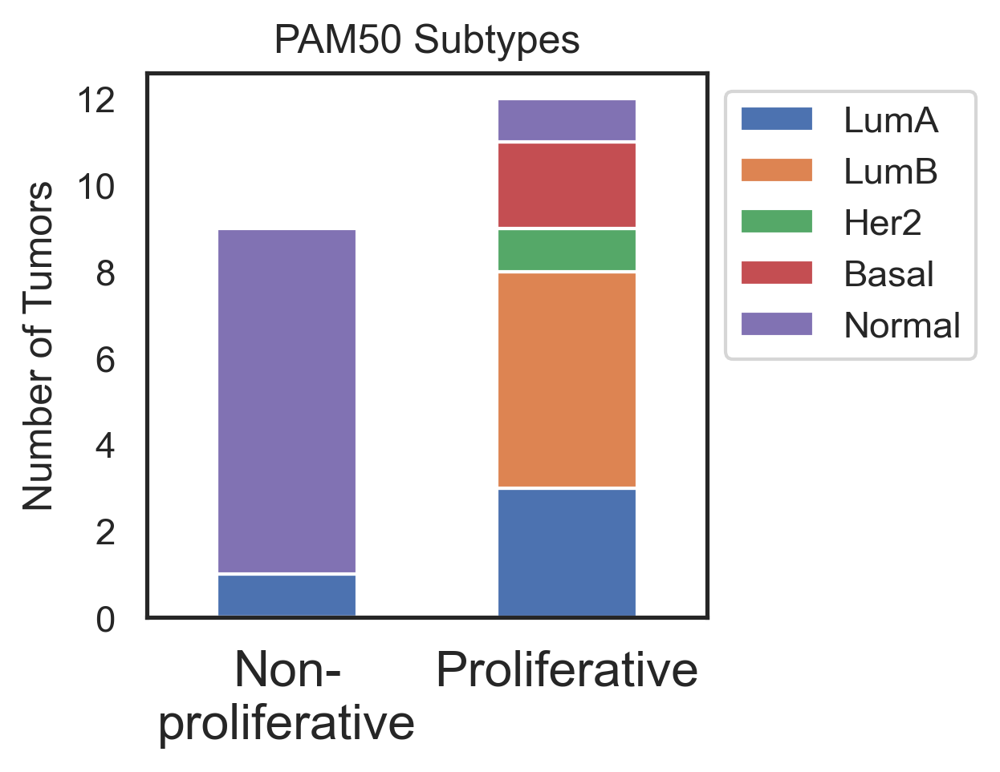

In [7]:
sns.set(style='white', font_scale=1.2)
plt.rcParams['figure.dpi'] = 300  # set default dpi to 300

df = pd.read_csv('../data/classifier/2_class_pam50.csv', index_col=0)
tbl = df.groupby(['class_2c', 'PAM50']).size().unstack().loc[:,['LumA','LumB','Her2','Basal','Normal']].fillna(0)

print(tbl)

sns.set(context='notebook', style='white', palette='deep', font='sans-serif', font_scale=1, color_codes=True)

fig, ax = plt.subplots(figsize=(3,3))

tbl.plot(kind='bar', stacked=True, ax=ax)
# ax.get_legend().remove()
ax.set_ylabel('Number of Tumors')
ax.set_xlabel('')
ax.set_xticklabels(['Non-\nproliferative', 'Proliferative'], fontsize=15, rotation=0, ha='center')

ax.set_title('PAM50 Subtypes')
ax.legend(bbox_to_anchor=(1, 1), loc='upper left')


# Deconvolution

Run `05_deconvolution.R`

In [18]:
os.system("Rscript 05_deconvolution.R")


Attaching package: ‘dplyr’

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Attaching package: ‘matrixStats’

The following object is masked from ‘package:dplyr’:

    count

ComplexHeatmap version 2.15.3
Bioconductor page: http://bioconductor.org/packages/ComplexHeatmap/
Github page: https://github.com/jokergoo/ComplexHeatmap
Documentation: http://jokergoo.github.io/ComplexHeatmap-reference

If you use it in published research, please cite either one:
- Gu, Z. Complex Heatmap Visualization. iMeta 2022.
- Gu, Z. Complex heatmaps reveal patterns and correlations in multidimensional 
    genomic data. Bioinformatics 2016.


The new InteractiveComplexHeatmap package can directly export static 
complex heatmaps into an interactive Shiny app with zero effort. Have a try!

This message can be suppressed by:
  suppressPackageStartupMessages(library(ComplexHeatmap))

circl

256

In [18]:
meta = pd.read_csv('../data/classifier/2_class_pam50.csv', index_col=0)
meta['ILC Subtype'] = meta['class_2c']
meta

,PAM50,ADH1B,ADH1C,ALDH1L1,AQP7P1,BBOX1,C2orf40,CAPN6,CD300LG,CHRDL1,...,STAC2,STX11,TMEM132C,TNMD,TNXB,TP63,pred,dataset,class_2c,ILC Subtype
TP17_M605,Normal,2.216732,2.243131,3.057598,4.052967,0.086482,0.532357,1.635425,2.176191,2.184944,...,-0.104408,2.059167,3.019646,2.782020,3.840547,0.161899,1,ILC,Non-proliferative,Non-proliferative
TP18_M403,Normal,0.933985,0.902377,-0.642738,1.732441,0.390396,0.222004,0.388856,0.012006,0.673717,...,0.158251,0.553468,0.711447,-1.259790,2.591020,-0.545052,1,ILC,Non-proliferative,Non-proliferative
TP17_M383,Her2,0.447186,0.403479,-0.249879,0.766307,-1.139162,-0.897606,0.244929,0.147138,0.256099,...,-0.791153,-1.536797,0.864486,-0.091378,1.674882,-0.475650,2,ILC,Proliferative,Proliferative
TP18_M202,Normal,0.567718,1.100668,-0.249642,-0.151507,0.059297,0.227326,0.811840,-0.355994,0.515171,...,0.604147,0.201882,0.153577,-0.387166,2.466430,0.299445,0,ILC,Non-proliferative,Non-proliferative
TP18_M355,Normal,0.672538,1.513375,-0.648330,0.595814,-0.714074,-0.218622,0.809317,-1.017934,1.021178,...,-0.070458,-0.277383,0.553212,0.780105,2.808701,-0.044340,1,ILC,Non-proliferative,Non-proliferative
TP17_M510,LumB,0.830330,0.131490,0.100744,0.155720,0.828979,-1.804247,-1.384409,-0.256367,0.310411,...,-0.129946,-1.502332,-0.776591,-1.069007,1.392548,0.065155,2,ILC,Proliferative,Proliferative
TP17_M802,LumA,0.375887,-0.585520,-0.570657,-0.759950,-0.164619,-1.804247,-1.423712,-1.417968,-0.897053,...,-1.446243,-1.074886,-0.912153,-0.229906,-0.340814,-0.931656,2,ILC,Proliferative,Proliferative
TP17_M882,LumB,-0.542579,-0.717786,-1.241718,-0.937231,-1.247996,-1.238878,-1.583364,-1.391339,-0.740829,...,-1.157850,-0.939527,-0.877570,-0.577537,-0.381364,-1.689603,2,ILC,Proliferative,Proliferative
TP18_M329,Basal,-0.073613,0.744683,-0.938536,1.020368,0.408761,-1.155406,-0.481491,-0.378645,0.249028,...,-0.045833,0.658627,-0.887453,0.193058,1.597698,0.208274,2,ILC,Proliferative,Proliferative
TP17_M378,LumB,-2.450577,-1.509660,-1.550600,-0.695033,-1.544119,-1.804247,-1.591658,-1.417968,-2.025407,...,-1.485269,-2.432829,-1.587066,-1.259790,-1.205105,-1.551170,2,ILC,Proliferative,Proliferative


## Purity

In [15]:
purity = pd.read_csv('../data/deconv/purity_puree.csv')
purity

,sample,purity
0,TP17_M605,0.505112
1,TP18_M403,0.545725
2,TP17_M383,0.651267
3,TP18_M202,0.596360
4,TP18_M355,0.609299
5,TP17_M510,0.620821
6,TP17_M802,0.774018
7,TP17_M882,0.700684
8,TP18_M329,0.493720
9,TP17_M378,0.810059


In [16]:
print(purity['purity'].min(), purity['purity'].max())

0.4937202911918662 0.8686968979741588


In [17]:
pam50 = pd.read_csv('../data/heatmap/Meta_Subtype_57genes_BulkRNAseqCohort.csv',index_col=0)
pam50

,PAM50,ADH1B,ADH1C,ALDH1L1,AQP7P1,BBOX1,C2orf40,CAPN6,CD300LG,CHRDL1,...,Race,Postmenopausal,Pathological grade,Pathological stage,Ki67,ER,PR,HER2,ER IHC score,ILC Subtype
TP17_M605,Normal,2.216732,2.243131,3.057598,4.052967,0.086482,0.532357,1.635425,2.176191,2.184944,...,White,No,1,1A,65,Positive,Positive,Negative,140.0,Non-proliferative
TP18_M403,Normal,0.933985,0.902377,-0.642738,1.732441,0.390396,0.222004,0.388856,0.012006,0.673717,...,White,Yes,1,1A,1,Positive,Negative,Negative,140.0,Non-proliferative
TP17_M383,Her2,0.447186,0.403479,-0.249879,0.766307,-1.139162,-0.897606,0.244929,0.147138,0.256099,...,White,No,3,3C,3,Positive,Positive,Negative,NaN,Proliferative
TP18_M202,Normal,0.567718,1.100668,-0.249642,-0.151507,0.059297,0.227326,0.811840,-0.355994,0.515171,...,White,Yes,2,1A,15,Positive,Positive,Negative,225.0,Non-proliferative
TP18_M355,Normal,0.672538,1.513375,-0.648330,0.595814,-0.714074,-0.218622,0.809317,-1.017934,1.021178,...,Other,Yes,2,1A,5,Positive,Positive,Negative,260.0,Non-proliferative
TP17_M510,LumB,0.830330,0.131490,0.100744,0.155720,0.828979,-1.804247,-1.384409,-0.256367,0.310411,...,White,No,2,1A,15,Positive,Positive,Negative,240.0,Proliferative
TP17_M802,LumA,0.375887,-0.585520,-0.570657,-0.759950,-0.164619,-1.804247,-1.423712,-1.417968,-0.897053,...,White,No,2,1A,25,Positive,Positive,None,195.0,Proliferative
TP17_M882,LumB,-0.542579,-0.717786,-1.241718,-0.937231,-1.247996,-1.238878,-1.583364,-1.391339,-0.740829,...,White,Yes,2,3A,35,Positive,Positive,Negative,300.0,Proliferative
TP18_M329,Basal,-0.073613,0.744683,-0.938536,1.020368,0.408761,-1.155406,-0.481491,-0.378645,0.249028,...,White,Yes,2,1B,8,Positive,Positive,Negative,300.0,Proliferative
TP17_M378,LumB,-2.450577,-1.509660,-1.550600,-0.695033,-1.544119,-1.804247,-1.591658,-1.417968,-2.025407,...,Other,No,3,2A,30,Positive,Positive,Negative,270.0,Proliferative


In [18]:
purity = purity.set_index('sample')
purity

,purity
sample,
TP17_M605,0.505112
TP18_M403,0.545725
TP17_M383,0.651267
TP18_M202,0.596360
TP18_M355,0.609299
TP17_M510,0.620821
TP17_M802,0.774018
TP17_M882,0.700684
TP18_M329,0.493720


In [19]:
mg = pam50.join(purity)[['PAM50','purity']]
mg

,PAM50,purity
TP17_M605,Normal,0.505112
TP18_M403,Normal,0.545725
TP17_M383,Her2,0.651267
TP18_M202,Normal,0.596360
TP18_M355,Normal,0.609299
TP17_M510,LumB,0.620821
TP17_M802,LumA,0.774018
TP17_M882,LumB,0.700684
TP18_M329,Basal,0.493720
TP17_M378,LumB,0.810059


(0.4, 1.0)

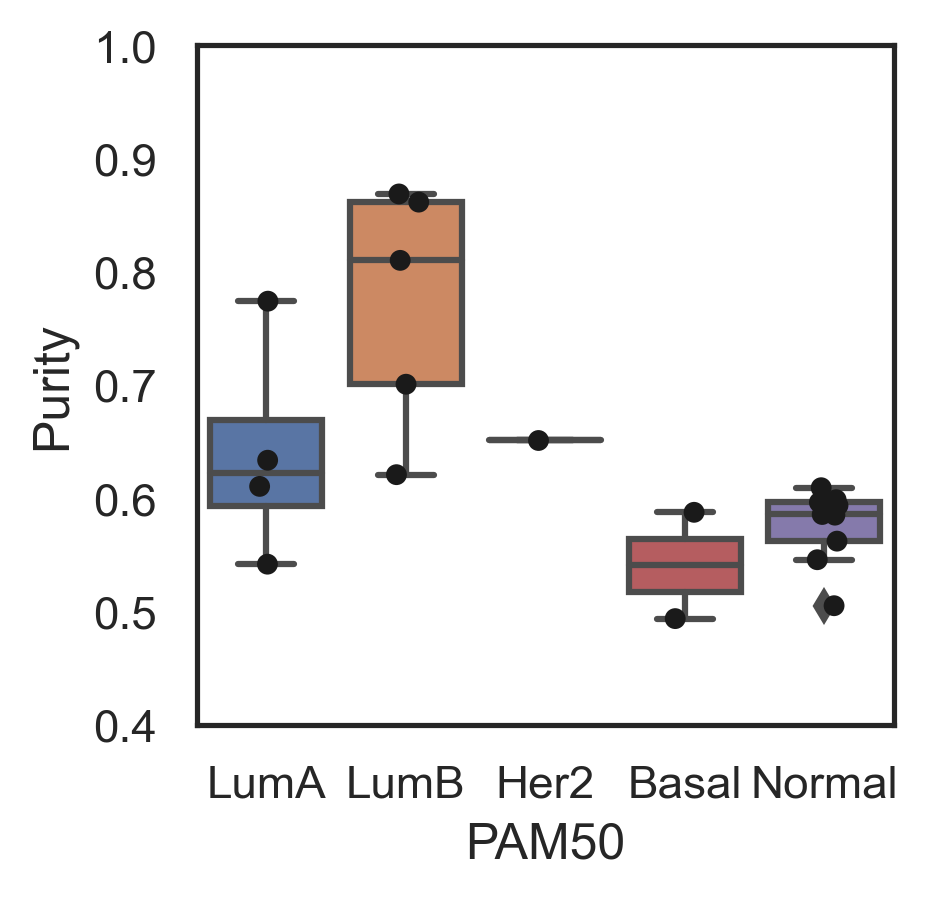

In [22]:
pam50_order = ['LumA', 'LumB', 'Her2', 'Basal', 'Normal']

fig, ax = plt.subplots(figsize=(3,3))
sns.boxplot(data=mg, x='PAM50',y='purity', order=pam50_order)
sns.stripplot(data=mg, x='PAM50',y='purity', order=pam50_order, color='k', jitter=True)

ax.set_ylabel('Purity')
ax.set_ylim([.4,1])

## Estimate

In [5]:
meta = pd.read_csv('../data/classifier/2_class_pam50.csv', index_col=0)
meta['ILC Subtype'] = meta['class_2c']
meta

,PAM50,ADH1B,ADH1C,ALDH1L1,AQP7P1,BBOX1,C2orf40,CAPN6,CD300LG,CHRDL1,...,STAC2,STX11,TMEM132C,TNMD,TNXB,TP63,pred,dataset,class_2c,ILC Subtype
TP17_M605,Normal,2.216732,2.243131,3.057598,4.052967,0.086482,0.532357,1.635425,2.176191,2.184944,...,-0.104408,2.059167,3.019646,2.782020,3.840547,0.161899,1,ILC,Non-proliferative,Non-proliferative
TP18_M403,Normal,0.933985,0.902377,-0.642738,1.732441,0.390396,0.222004,0.388856,0.012006,0.673717,...,0.158251,0.553468,0.711447,-1.259790,2.591020,-0.545052,1,ILC,Non-proliferative,Non-proliferative
TP17_M383,Her2,0.447186,0.403479,-0.249879,0.766307,-1.139162,-0.897606,0.244929,0.147138,0.256099,...,-0.791153,-1.536797,0.864486,-0.091378,1.674882,-0.475650,2,ILC,Proliferative,Proliferative
TP18_M202,Normal,0.567718,1.100668,-0.249642,-0.151507,0.059297,0.227326,0.811840,-0.355994,0.515171,...,0.604147,0.201882,0.153577,-0.387166,2.466430,0.299445,0,ILC,Non-proliferative,Non-proliferative
TP18_M355,Normal,0.672538,1.513375,-0.648330,0.595814,-0.714074,-0.218622,0.809317,-1.017934,1.021178,...,-0.070458,-0.277383,0.553212,0.780105,2.808701,-0.044340,1,ILC,Non-proliferative,Non-proliferative
TP17_M510,LumB,0.830330,0.131490,0.100744,0.155720,0.828979,-1.804247,-1.384409,-0.256367,0.310411,...,-0.129946,-1.502332,-0.776591,-1.069007,1.392548,0.065155,2,ILC,Proliferative,Proliferative
TP17_M802,LumA,0.375887,-0.585520,-0.570657,-0.759950,-0.164619,-1.804247,-1.423712,-1.417968,-0.897053,...,-1.446243,-1.074886,-0.912153,-0.229906,-0.340814,-0.931656,2,ILC,Proliferative,Proliferative
TP17_M882,LumB,-0.542579,-0.717786,-1.241718,-0.937231,-1.247996,-1.238878,-1.583364,-1.391339,-0.740829,...,-1.157850,-0.939527,-0.877570,-0.577537,-0.381364,-1.689603,2,ILC,Proliferative,Proliferative
TP18_M329,Basal,-0.073613,0.744683,-0.938536,1.020368,0.408761,-1.155406,-0.481491,-0.378645,0.249028,...,-0.045833,0.658627,-0.887453,0.193058,1.597698,0.208274,2,ILC,Proliferative,Proliferative
TP17_M378,LumB,-2.450577,-1.509660,-1.550600,-0.695033,-1.544119,-1.804247,-1.591658,-1.417968,-2.025407,...,-1.485269,-2.432829,-1.587066,-1.259790,-1.205105,-1.551170,2,ILC,Proliferative,Proliferative


In [4]:
est = pd.read_csv('../data/deconv/deconvolute_estimate.csv', index_col=0).T
est

,StromalScore,ImmuneScore,ESTIMATEScore,TumorPurity
TP17_M605,1261.167388,1236.225520,2497.392908,0.563999
TP18_M403,1656.005419,1820.957816,3476.963236,0.439850
TP17_M383,685.518125,-95.476464,590.041660,0.770228
TP18_M202,1261.399582,1033.729730,2295.129312,0.588264
TP18_M355,1243.608398,1001.449646,2245.058043,0.594192
TP17_M510,605.872316,936.522861,1542.395177,0.673847
TP17_M802,-22.624893,480.295560,457.670667,0.782474
TP17_M882,232.594440,936.535514,1169.129954,0.713299
TP18_M329,998.270299,2004.581511,3002.851810,0.501235
TP17_M378,28.551182,-155.799733,-127.248551,0.832989


In [9]:
mg = meta[['ILC Subtype']].join(est)

mg = mg[['TumorPurity','StromalScore','ImmuneScore','ILC Subtype']]
mg.columns = ['Tumor Purity','Stromal Score','Immune Score','ILC Subtype']
mg

,Tumor Purity,Stromal Score,Immune Score,ILC Subtype
TP17_M605,0.563999,1261.167388,1236.225520,Non-proliferative
TP18_M403,0.439850,1656.005419,1820.957816,Non-proliferative
TP17_M383,0.770228,685.518125,-95.476464,Proliferative
TP18_M202,0.588264,1261.399582,1033.729730,Non-proliferative
TP18_M355,0.594192,1243.608398,1001.449646,Non-proliferative
TP17_M510,0.673847,605.872316,936.522861,Proliferative
TP17_M802,0.782474,-22.624893,480.295560,Proliferative
TP17_M882,0.713299,232.594440,936.535514,Proliferative
TP18_M329,0.501235,998.270299,2004.581511,Proliferative
TP17_M378,0.832989,28.551182,-155.799733,Proliferative


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:5.066e-02 U_stat=2.600e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:9.488e-03 U_stat=9.100e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.452e-01 U_stat=7.500

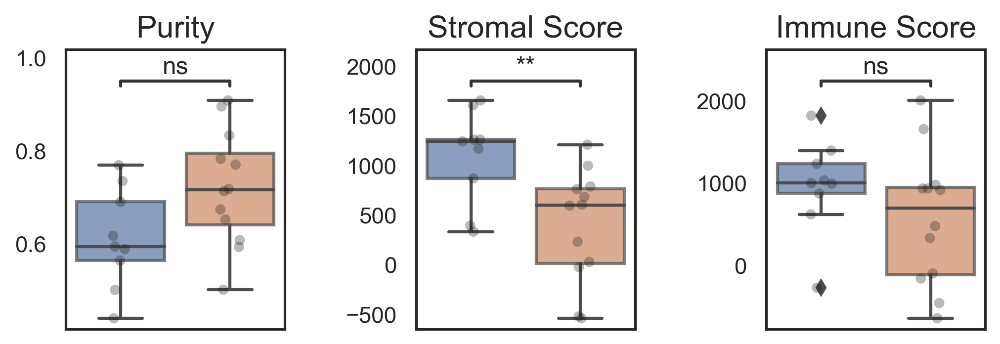

In [11]:
sns.set(style='white', font_scale=1)
plt.rcParams['figure.dpi'] = 300  # set default dpi to 300

group_name = 'ILC Subtype'
terms = ['Tumor Purity','Stromal Score','Immune Score']#,'estimate']
fig,axes = plt.subplots(ncols=len(terms), figsize=(8,2.5))

fig.subplots_adjust(hspace=0, wspace=.6)

for idx,name in enumerate(terms):
    
    ax = axes.flatten()[idx]
    
    mg[name] = mg[name].astype(float)
 #     sorted_cells = mg[name].median().sort_values(ascending=False).index
    sns.boxplot(data=mg, x=group_name,y=name, ax=ax, boxprops=dict(alpha=.7))
    sns.stripplot(data=mg, x=group_name,y=name, ax=ax, alpha=.3, size=5, jitter=True, color='k')
    ax.set_xlabel(''); ax.set_ylabel('')
    
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 20, ha='right')
    
    title = ['Purity','Stromal Score','Immune Score'][idx]
    ax.set_title(title, fontsize=15)
    ax.set_xticklabels('')

    pairs = [('Non-proliferative', 'Proliferative')]
    
    hue_plot_params = {
    'data': mg,
    'x': group_name,
    'y': name
}
    
    annotator = Annotator(ax, pairs, **hue_plot_params)
    annotator.configure(test='Mann-Whitney', text_format='star', loc='inside', comparisons_correction='fdr_bh')
    annotator.apply_and_annotate()
    


## xcell

In [25]:
est = pd.read_csv('../data/deconv/xcell.csv', index_col=0).T#.set_index('sample')
est

,aDC,Adipocytes,Astrocytes,B-cells,Basophils,CD4+ memory T-cells,CD4+ naive T-cells,CD4+ T-cells,CD4+ Tcm,CD4+ Tem,...,Sebocytes,Skeletal muscle,Smooth muscle,Tgd cells,Th1 cells,Th2 cells,Tregs,ImmuneScore,StromaScore,MicroenvironmentScore
TP17_M605,5.666637e-02,3.246927e-01,2.094130e-18,0.000000e+00,2.136817e-02,3.009987e-24,1.943685e-18,8.914351e-18,1.873858e-18,9.060483e-02,...,1.406477e-19,1.792136e-19,8.241621e-02,0.000000e+00,2.528873e-19,5.212881e-04,0.000000e+00,1.173170e-02,2.864691e-01,0.298201
TP18_M403,7.241089e-02,4.305336e-02,4.036296e-02,7.486288e-20,5.850029e-02,0.000000e+00,0.000000e+00,4.828047e-18,0.000000e+00,3.603588e-02,...,0.000000e+00,0.000000e+00,6.367982e-02,0.000000e+00,0.000000e+00,7.095590e-04,4.083279e-18,1.281833e-01,1.187739e-01,0.246957
TP17_M383,1.769211e-18,2.528880e-02,2.349190e-02,3.458056e-02,2.861814e-02,4.670023e-19,3.670537e-03,0.000000e+00,0.000000e+00,4.652918e-18,...,0.000000e+00,0.000000e+00,8.139919e-02,3.542371e-18,1.852440e-03,2.184897e-02,5.769147e-03,2.305371e-02,8.370758e-02,0.106761
TP18_M202,7.270837e-02,4.691104e-02,6.738118e-02,1.624542e-18,7.192564e-02,0.000000e+00,0.000000e+00,7.183499e-19,1.173211e-18,5.947595e-02,...,5.666326e-04,3.204619e-19,6.267552e-02,5.067019e-19,6.911022e-18,3.569934e-03,0.000000e+00,1.608051e-02,9.302729e-02,0.109108
TP18_M355,3.294073e-02,3.661305e-02,1.356853e-03,1.356177e-18,1.227582e-01,3.020170e-20,0.000000e+00,7.840438e-18,0.000000e+00,6.765886e-03,...,0.000000e+00,2.780813e-04,2.010204e-01,1.378825e-19,4.916813e-20,2.046833e-03,9.057318e-19,2.824502e-02,8.535376e-02,0.113599
TP17_M510,6.385115e-02,6.584990e-02,0.000000e+00,9.039282e-03,6.107321e-02,9.466220e-03,5.303706e-18,2.391746e-18,4.793478e-18,5.902402e-02,...,1.423431e-03,0.000000e+00,1.012319e-01,2.207389e-03,0.000000e+00,3.230970e-02,1.583162e-19,2.804103e-02,6.306843e-02,0.091109
TP17_M802,3.791996e-02,4.294705e-02,0.000000e+00,8.597412e-20,6.371661e-02,6.168180e-21,0.000000e+00,6.976838e-19,5.003359e-18,2.973937e-02,...,0.000000e+00,1.876796e-18,8.763774e-02,6.007603e-04,5.839138e-03,3.366636e-02,0.000000e+00,1.439234e-02,2.147353e-02,0.035866
TP17_M882,3.224345e-02,0.000000e+00,0.000000e+00,0.000000e+00,6.472970e-02,6.776978e-03,0.000000e+00,5.291645e-19,0.000000e+00,2.569974e-02,...,4.771291e-20,9.304569e-19,6.989892e-02,8.190503e-03,1.864262e-19,6.473505e-02,5.290346e-03,4.488511e-02,5.613964e-03,0.050499
TP18_M329,1.454389e-01,2.031052e-02,1.575392e-02,2.612960e-01,1.086247e-01,5.654818e-02,1.493769e-02,9.505596e-19,2.722900e-19,6.625950e-02,...,0.000000e+00,1.583858e-03,6.144771e-02,0.000000e+00,6.827257e-18,1.262870e-01,3.891709e-03,2.508179e-01,8.943123e-02,0.340249
TP17_M378,1.945419e-02,6.568729e-19,6.612196e-19,3.578464e-04,1.197737e-18,2.310395e-03,0.000000e+00,5.563564e-19,9.787222e-19,6.226523e-20,...,0.000000e+00,4.153677e-20,7.374547e-02,2.464144e-02,1.623056e-02,1.287172e-01,2.931551e-03,1.335092e-02,1.207273e-18,0.013351


In [26]:
mg = meta[['ILC Subtype']].join(est)
mg

,ILC Subtype,aDC,Adipocytes,Astrocytes,B-cells,Basophils,CD4+ memory T-cells,CD4+ naive T-cells,CD4+ T-cells,CD4+ Tcm,...,Sebocytes,Skeletal muscle,Smooth muscle,Tgd cells,Th1 cells,Th2 cells,Tregs,ImmuneScore,StromaScore,MicroenvironmentScore
TP17_M605,Non-proliferative,5.666637e-02,3.246927e-01,2.094130e-18,0.000000e+00,2.136817e-02,3.009987e-24,1.943685e-18,8.914351e-18,1.873858e-18,...,1.406477e-19,1.792136e-19,8.241621e-02,0.000000e+00,2.528873e-19,5.212881e-04,0.000000e+00,1.173170e-02,2.864691e-01,0.298201
TP18_M403,Non-proliferative,7.241089e-02,4.305336e-02,4.036296e-02,7.486288e-20,5.850029e-02,0.000000e+00,0.000000e+00,4.828047e-18,0.000000e+00,...,0.000000e+00,0.000000e+00,6.367982e-02,0.000000e+00,0.000000e+00,7.095590e-04,4.083279e-18,1.281833e-01,1.187739e-01,0.246957
TP17_M383,Proliferative,1.769211e-18,2.528880e-02,2.349190e-02,3.458056e-02,2.861814e-02,4.670023e-19,3.670537e-03,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,8.139919e-02,3.542371e-18,1.852440e-03,2.184897e-02,5.769147e-03,2.305371e-02,8.370758e-02,0.106761
TP18_M202,Non-proliferative,7.270837e-02,4.691104e-02,6.738118e-02,1.624542e-18,7.192564e-02,0.000000e+00,0.000000e+00,7.183499e-19,1.173211e-18,...,5.666326e-04,3.204619e-19,6.267552e-02,5.067019e-19,6.911022e-18,3.569934e-03,0.000000e+00,1.608051e-02,9.302729e-02,0.109108
TP18_M355,Non-proliferative,3.294073e-02,3.661305e-02,1.356853e-03,1.356177e-18,1.227582e-01,3.020170e-20,0.000000e+00,7.840438e-18,0.000000e+00,...,0.000000e+00,2.780813e-04,2.010204e-01,1.378825e-19,4.916813e-20,2.046833e-03,9.057318e-19,2.824502e-02,8.535376e-02,0.113599
TP17_M510,Proliferative,6.385115e-02,6.584990e-02,0.000000e+00,9.039282e-03,6.107321e-02,9.466220e-03,5.303706e-18,2.391746e-18,4.793478e-18,...,1.423431e-03,0.000000e+00,1.012319e-01,2.207389e-03,0.000000e+00,3.230970e-02,1.583162e-19,2.804103e-02,6.306843e-02,0.091109
TP17_M802,Proliferative,3.791996e-02,4.294705e-02,0.000000e+00,8.597412e-20,6.371661e-02,6.168180e-21,0.000000e+00,6.976838e-19,5.003359e-18,...,0.000000e+00,1.876796e-18,8.763774e-02,6.007603e-04,5.839138e-03,3.366636e-02,0.000000e+00,1.439234e-02,2.147353e-02,0.035866
TP17_M882,Proliferative,3.224345e-02,0.000000e+00,0.000000e+00,0.000000e+00,6.472970e-02,6.776978e-03,0.000000e+00,5.291645e-19,0.000000e+00,...,4.771291e-20,9.304569e-19,6.989892e-02,8.190503e-03,1.864262e-19,6.473505e-02,5.290346e-03,4.488511e-02,5.613964e-03,0.050499
TP18_M329,Proliferative,1.454389e-01,2.031052e-02,1.575392e-02,2.612960e-01,1.086247e-01,5.654818e-02,1.493769e-02,9.505596e-19,2.722900e-19,...,0.000000e+00,1.583858e-03,6.144771e-02,0.000000e+00,6.827257e-18,1.262870e-01,3.891709e-03,2.508179e-01,8.943123e-02,0.340249
TP17_M378,Proliferative,1.945419e-02,6.568729e-19,6.612196e-19,3.578464e-04,1.197737e-18,2.310395e-03,0.000000e+00,5.563564e-19,9.787222e-19,...,0.000000e+00,4.153677e-20,7.374547e-02,2.464144e-02,1.623056e-02,1.287172e-01,2.931551e-03,1.335092e-02,1.207273e-18,0.013351


In [27]:
group_name = 'ILC Subtype'
terms = est.columns
fig,axes = plt.subplots(ncols=8, nrows=9, figsize=(25,40))

fig.subplots_adjust(hspace=0.5, wspace=.8)

for idx,name in enumerate(terms):
    
    ax = axes.flatten()[idx]
    
    mg[name] = mg[name].astype(float)
 #     sorted_cells = mg[name].median().sort_values(ascending=False).index
    sns.boxplot(data=mg, x=group_name,y=name, ax=ax, boxprops=dict(alpha=.7))
    sns.stripplot(data=mg, x=group_name,y=name, ax=ax, alpha=.3, size=5, jitter=True, color='k')
    ax.set_xlabel(''); ax.set_ylabel('')
    ax.set_title(name, fontsize=15)

    ax.set_xticklabels('')#(ax.get_xticklabels(), rotation = 90)

    
    pairs = [('Non-proliferative', 'Proliferative')]
    
    hue_plot_params = {
    'data': mg,
    'x': group_name,
    'y': name
}
    
    annotator = Annotator(ax, pairs, **hue_plot_params)
    annotator.configure(test='Mann-Whitney', text_format='star', loc='inside', comparisons_correction='fdr_bh')
    annotator.apply_and_annotate()

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:9.151e-01 U_stat=5.200e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:7.363e-04 U_stat=1.020e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:4.107e-01 U_stat=6.600

/opt/anaconda3/envs/py38/lib/python3.8/site-packages/statannotations/_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:8.415e-02 U_stat=3.100e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:6.877e-01 U_stat=6.000e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:8.478e-01 U_stat=5.100

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:3.372e-01 U_stat=6.800e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:8.588e-01 U_stat=5.700e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:9.491e-02 U_stat=7.800

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.580e-01 U_stat=3.400e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:9.417e-01 U_stat=5.250e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:5.293e-01 U_stat=6.300

## CibersortX

In [28]:
est = pd.read_csv('../data/deconv/CIBERSORTx_Job5_Results.csv', index_col=0)
est

,B cells naive,B cells memory,Plasma cells,T cells CD8,T cells CD4 naive,T cells CD4 memory resting,T cells CD4 memory activated,T cells follicular helper,T cells regulatory (Tregs),T cells gamma delta,...,Dendritic cells resting,Dendritic cells activated,Mast cells resting,Mast cells activated,Eosinophils,Neutrophils,P-value,Correlation,RMSE,Absolute score (sig.score)
Mixture,,,,,,,,,,,,,,,,,,,,,
TP17_M605,0.396109,0.272450,0.059952,0.000000,0.000000,3.086872,0.124399,0.251549,0.000000,0.000000,...,0.000000,0.000000,0.448670,0,0.000000,0.000000,0.00,0.216349,1.001762,6.738566
TP18_M403,0.000000,0.173528,0.000000,0.000000,0.000000,0.870048,0.078636,0.000000,0.000000,0.072454,...,0.000000,0.000000,0.709762,0,0.000000,0.000000,0.00,0.551284,0.845114,9.434004
TP17_M383,0.036953,1.033268,0.017917,0.000000,0.495422,0.963566,0.000000,0.075722,0.000000,0.000000,...,0.098114,0.000000,0.416610,0,0.000000,0.000000,0.12,0.095591,1.049584,3.868561
TP18_M202,0.233788,0.270239,0.000000,0.000000,0.000000,1.493165,0.000000,0.323985,0.000000,0.014255,...,0.127170,0.000000,0.582171,0,0.023286,0.000000,0.00,0.277306,0.987352,6.849300
TP18_M355,0.141651,0.000000,0.190178,0.000000,0.000000,1.572582,0.243117,0.000000,0.000000,0.000000,...,0.115879,0.053056,0.946914,0,0.010939,0.000000,0.00,0.246722,0.986671,6.199328
TP17_M510,0.000000,0.552178,0.000000,0.216408,0.000000,1.723746,0.204608,0.055837,0.000000,0.146113,...,0.363616,0.000000,0.440361,0,0.089417,0.000000,0.01,0.148066,1.020214,5.016153
TP17_M802,0.141296,0.000000,0.009650,0.030908,0.000000,1.120073,0.109330,0.393149,0.000000,0.142982,...,0.134020,0.000000,0.394051,0,0.392105,0.083955,0.12,0.097868,1.038797,4.444817
TP17_M882,0.000000,0.015835,0.001933,0.000000,0.000000,1.456903,0.145008,0.204067,0.000000,0.000000,...,0.046638,0.000000,0.528922,0,0.207039,0.093608,0.10,0.105708,1.044604,5.669864
TP18_M329,0.501872,1.056828,0.000000,0.000000,0.000000,2.313547,0.071587,0.322306,0.000000,0.517298,...,0.000000,0.000000,0.630298,0,0.078913,0.000000,0.00,0.345052,0.940904,7.014430


In [29]:
mg = meta[['ILC Subtype']].join(est)
mg

,ILC Subtype,B cells naive,B cells memory,Plasma cells,T cells CD8,T cells CD4 naive,T cells CD4 memory resting,T cells CD4 memory activated,T cells follicular helper,T cells regulatory (Tregs),...,Dendritic cells resting,Dendritic cells activated,Mast cells resting,Mast cells activated,Eosinophils,Neutrophils,P-value,Correlation,RMSE,Absolute score (sig.score)
TP17_M605,Non-proliferative,0.396109,0.272450,0.059952,0.000000,0.000000,3.086872,0.124399,0.251549,0.000000,...,0.000000,0.000000,0.448670,0,0.000000,0.000000,0.00,0.216349,1.001762,6.738566
TP18_M403,Non-proliferative,0.000000,0.173528,0.000000,0.000000,0.000000,0.870048,0.078636,0.000000,0.000000,...,0.000000,0.000000,0.709762,0,0.000000,0.000000,0.00,0.551284,0.845114,9.434004
TP17_M383,Proliferative,0.036953,1.033268,0.017917,0.000000,0.495422,0.963566,0.000000,0.075722,0.000000,...,0.098114,0.000000,0.416610,0,0.000000,0.000000,0.12,0.095591,1.049584,3.868561
TP18_M202,Non-proliferative,0.233788,0.270239,0.000000,0.000000,0.000000,1.493165,0.000000,0.323985,0.000000,...,0.127170,0.000000,0.582171,0,0.023286,0.000000,0.00,0.277306,0.987352,6.849300
TP18_M355,Non-proliferative,0.141651,0.000000,0.190178,0.000000,0.000000,1.572582,0.243117,0.000000,0.000000,...,0.115879,0.053056,0.946914,0,0.010939,0.000000,0.00,0.246722,0.986671,6.199328
TP17_M510,Proliferative,0.000000,0.552178,0.000000,0.216408,0.000000,1.723746,0.204608,0.055837,0.000000,...,0.363616,0.000000,0.440361,0,0.089417,0.000000,0.01,0.148066,1.020214,5.016153
TP17_M802,Proliferative,0.141296,0.000000,0.009650,0.030908,0.000000,1.120073,0.109330,0.393149,0.000000,...,0.134020,0.000000,0.394051,0,0.392105,0.083955,0.12,0.097868,1.038797,4.444817
TP17_M882,Proliferative,0.000000,0.015835,0.001933,0.000000,0.000000,1.456903,0.145008,0.204067,0.000000,...,0.046638,0.000000,0.528922,0,0.207039,0.093608,0.10,0.105708,1.044604,5.669864
TP18_M329,Proliferative,0.501872,1.056828,0.000000,0.000000,0.000000,2.313547,0.071587,0.322306,0.000000,...,0.000000,0.000000,0.630298,0,0.078913,0.000000,0.00,0.345052,0.940904,7.014430
TP17_M378,Proliferative,0.154255,0.000000,0.003784,0.000000,0.000000,0.651277,0.004317,0.402527,0.000000,...,0.004396,0.058394,0.408894,0,0.326783,0.005042,0.29,0.059646,1.069887,3.841914


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:8.292e-01 U_stat=5.750e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:9.127e-01 U_stat=5.600e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:5.344e-01 U_stat=6.300

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:3.604e-02 U_stat=8.400e+01


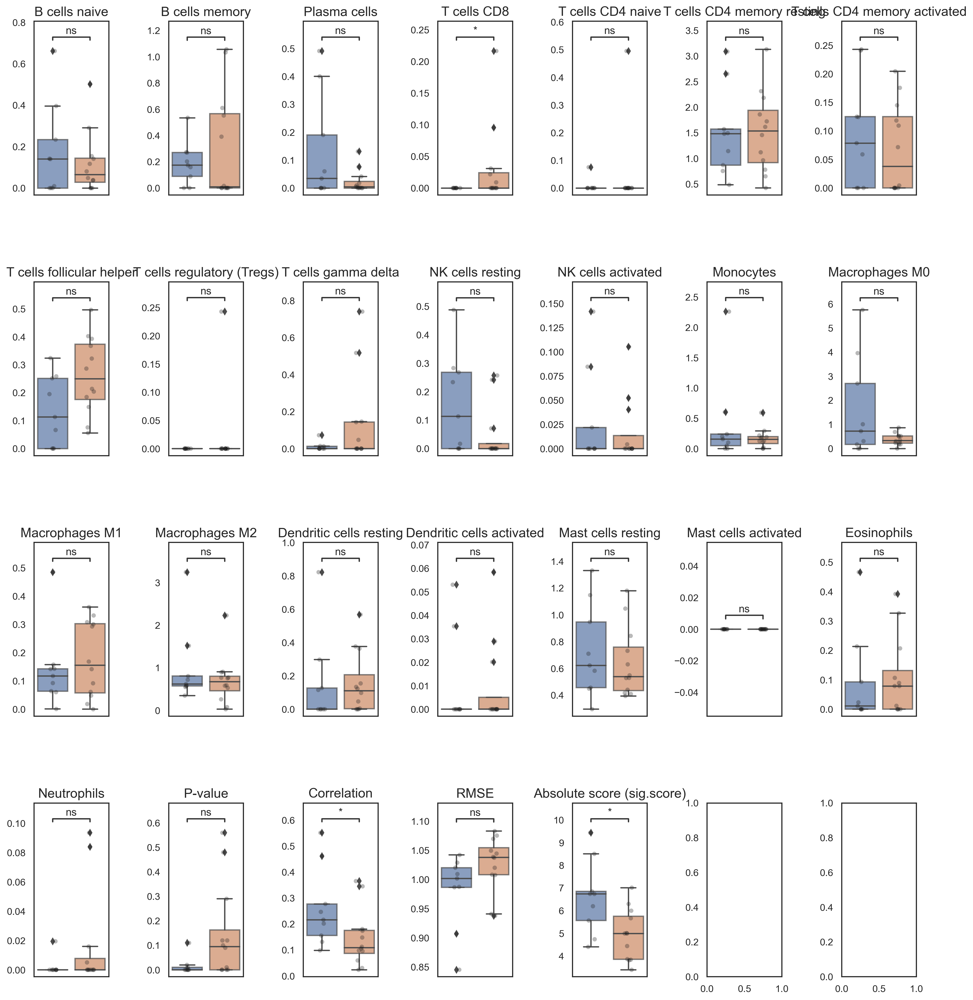

In [30]:
group_name = 'ILC Subtype'
terms = est.columns
fig,axes = plt.subplots(ncols=7, nrows=4, figsize=(18,20))

fig.subplots_adjust(hspace=.5, wspace=.8)

for idx,name in enumerate(terms):
    
    ax = axes.flatten()[idx]
    
    mg[name] = mg[name].astype(float)
 #     sorted_cells = mg[name].median().sort_values(ascending=False).index
    sns.boxplot(data=mg, x=group_name,y=name, ax=ax, boxprops=dict(alpha=.7))
    sns.stripplot(data=mg, x=group_name,y=name, ax=ax, alpha=.3, size=5, jitter=True, color='k')
    ax.set_xlabel(''); ax.set_ylabel('')
    ax.set_title(name, fontsize=15)

    ax.set_xticklabels('')#(ax.get_xticklabels(), rotation = 90)

    
    pairs = [('Non-proliferative', 'Proliferative')]
    
    hue_plot_params = {
    'data': mg,
    'x': group_name,
    'y': name
}
    
    annotator = Annotator(ax, pairs, **hue_plot_params)
    annotator.configure(test='Mann-Whitney', text_format='star', loc='inside', comparisons_correction='fdr_bh')
    annotator.apply_and_annotate()

## EPIC

In [31]:
est = pd.read_csv('../data/deconv/epic_cellFractions.csv', index_col=0)
est

,Bcells,CAFs,CD4_Tcells,CD8_Tcells,Endothelial,Macrophages,NKcells,otherCells
TP17_M605,0.016383,0.281665,0.123260,9.917023e-03,0.186782,0.003824,4.949971e-09,0.378169
TP18_M403,0.001844,0.536506,0.070377,4.073495e-03,0.085769,0.013605,1.747755e-08,0.287826
TP17_M383,0.015079,0.490323,0.067074,9.864869e-05,0.103282,0.001047,1.383230e-07,0.323095
TP18_M202,0.009600,0.332590,0.117337,1.315465e-02,0.079409,0.006921,2.515071e-08,0.440989
TP18_M355,0.003377,0.501194,0.084738,8.434911e-03,0.061912,0.006435,2.807631e-08,0.333910
TP17_M510,0.005496,0.174630,0.089557,1.864622e-02,0.043061,0.005265,1.810690e-09,0.663344
TP17_M802,0.003340,0.139481,0.082663,2.262421e-02,0.016814,0.004816,1.348708e-08,0.730263
TP17_M882,0.002275,0.086197,0.064791,4.550868e-02,0.029973,0.013902,3.893603e-09,0.757353
TP18_M329,0.036543,0.222049,0.150923,1.427729e-02,0.091245,0.004204,1.136175e-10,0.480759
TP17_M378,0.000111,0.144839,0.029363,1.313888e-02,0.009152,0.004534,4.767646e-08,0.798863


In [32]:
mg = meta[['ILC Subtype']].join(est)
mg

,ILC Subtype,Bcells,CAFs,CD4_Tcells,CD8_Tcells,Endothelial,Macrophages,NKcells,otherCells
TP17_M605,Non-proliferative,0.016383,0.281665,0.123260,9.917023e-03,0.186782,0.003824,4.949971e-09,0.378169
TP18_M403,Non-proliferative,0.001844,0.536506,0.070377,4.073495e-03,0.085769,0.013605,1.747755e-08,0.287826
TP17_M383,Proliferative,0.015079,0.490323,0.067074,9.864869e-05,0.103282,0.001047,1.383230e-07,0.323095
TP18_M202,Non-proliferative,0.009600,0.332590,0.117337,1.315465e-02,0.079409,0.006921,2.515071e-08,0.440989
TP18_M355,Non-proliferative,0.003377,0.501194,0.084738,8.434911e-03,0.061912,0.006435,2.807631e-08,0.333910
TP17_M510,Proliferative,0.005496,0.174630,0.089557,1.864622e-02,0.043061,0.005265,1.810690e-09,0.663344
TP17_M802,Proliferative,0.003340,0.139481,0.082663,2.262421e-02,0.016814,0.004816,1.348708e-08,0.730263
TP17_M882,Proliferative,0.002275,0.086197,0.064791,4.550868e-02,0.029973,0.013902,3.893603e-09,0.757353
TP18_M329,Proliferative,0.036543,0.222049,0.150923,1.427729e-02,0.091245,0.004204,1.136175e-10,0.480759
TP17_M378,Proliferative,0.000111,0.144839,0.029363,1.313888e-02,0.009152,0.004534,4.767646e-08,0.798863


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:9.717e-01 U_stat=5.300e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:3.744e-01 U_stat=6.700e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:4.138e-01 U_stat=6.600

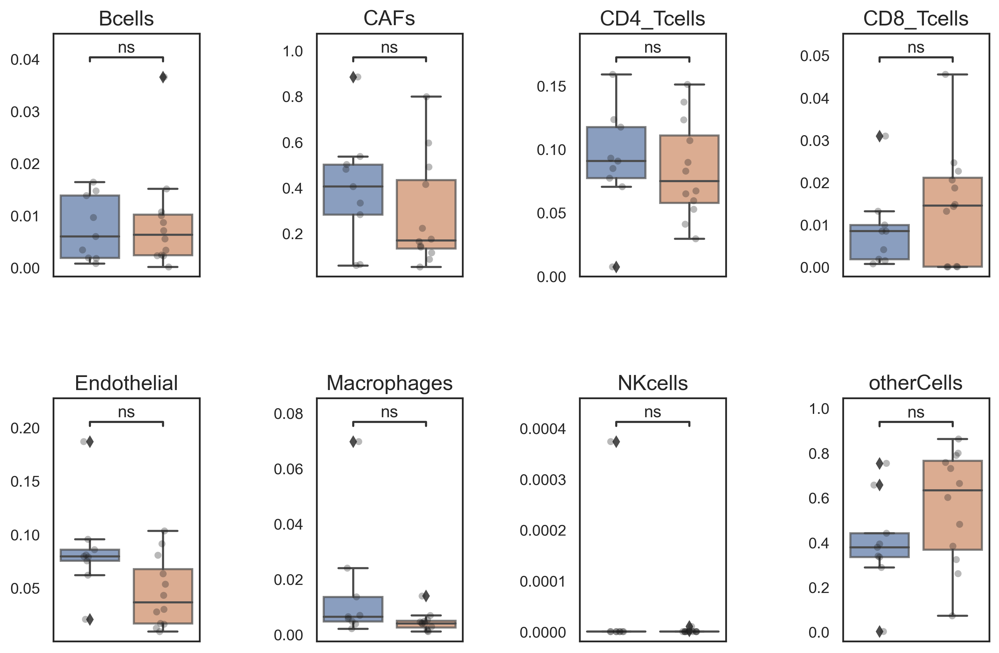

In [33]:
group_name = 'ILC Subtype'
terms = est.columns
fig,axes = plt.subplots(ncols=4, nrows=2, figsize=(12,8))

fig.subplots_adjust(hspace=.5, wspace=.8)

for idx,name in enumerate(terms):
    
    ax = axes.flatten()[idx]
    
    mg[name] = mg[name].astype(float)
 #     sorted_cells = mg[name].median().sort_values(ascending=False).index
    sns.boxplot(data=mg, x=group_name,y=name, ax=ax, boxprops=dict(alpha=.7))
    sns.stripplot(data=mg, x=group_name,y=name, ax=ax, alpha=.3, size=5, jitter=True, color='k')
    ax.set_xlabel(''); ax.set_ylabel('')
    ax.set_title(name, fontsize=15)

    ax.set_xticklabels('')#(ax.get_xticklabels(), rotation = 90)

    
    pairs = [('Non-proliferative', 'Proliferative')]
    
    hue_plot_params = {
    'data': mg,
    'x': group_name,
    'y': name
}
    
    annotator = Annotator(ax, pairs, **hue_plot_params)
    annotator.configure(test='Mann-Whitney', text_format='star', loc='inside', comparisons_correction='fdr_bh')
    annotator.apply_and_annotate()

## TIMER2.0 (and others)
http://timer.comp-genomics.org/timer/
```
If you used the estimation results, please also cite immunedeconv with TIMER, CIBERSORT, quanTIseq, xCell, MCP-counter (or mMCP-counter for mouse) and EPIC methods as well.
```

In [34]:
est = pd.read_csv('../data/deconv/TIMER2.0.csv', index_col=0).T
est

cell_type,B cell_TIMER,T cell CD4+_TIMER,T cell CD8+_TIMER,Neutrophil_TIMER,Macrophage_TIMER,Myeloid dendritic cell_TIMER,B cell naive_CIBERSORT,B cell memory_CIBERSORT,B cell plasma_CIBERSORT,T cell CD8+_CIBERSORT,...,T cell CD8+_MCPCOUNTER,cytotoxicity score_MCPCOUNTER,NK cell_MCPCOUNTER,B cell_MCPCOUNTER,Monocyte_MCPCOUNTER,Macrophage/Monocyte_MCPCOUNTER,Myeloid dendritic cell_MCPCOUNTER,Neutrophil_MCPCOUNTER,Endothelial cell_MCPCOUNTER,Cancer associated fibroblast_MCPCOUNTER
TP17_M605,0.105743,0.137454,0.210117,0.115620,0.035657,0.559685,0.064692,0.032257,0.011079,0.000000,...,1.590575,8.335896,1.107288,13.354083,17.882550,17.882550,6.658895,14.246030,45.066029,1128.817107
TP18_M403,0.112481,0.110203,0.200342,0.115744,0.091741,0.576455,0.000000,0.018467,0.000000,0.000000,...,1.909921,3.414359,0.339606,4.022825,62.731639,62.731639,4.915850,7.356150,18.859745,1653.828008
TP17_M383,0.089992,0.114772,0.209537,0.119311,0.046324,0.474378,0.007280,0.251062,0.001122,0.000000,...,0.000000,0.929624,0.169731,12.242166,5.836278,5.836278,2.074375,6.077742,21.730779,1401.780574
TP18_M202,0.111084,0.116722,0.203805,0.119175,0.059280,0.524991,0.036249,0.044296,0.000000,0.000000,...,1.329058,2.208636,0.541231,6.489438,27.055799,27.055799,4.498489,8.794800,18.075068,1099.166579
TP18_M355,0.102826,0.121628,0.205607,0.124873,0.075874,0.495576,0.024876,0.000000,0.034751,0.000024,...,0.680481,1.727893,0.384099,1.986817,22.177983,22.177983,4.936255,12.763391,16.672974,1665.077929
TP17_M510,0.094077,0.116779,0.214482,0.123263,0.058828,0.471847,0.000000,0.112375,0.000000,0.037695,...,1.106890,3.092011,0.102313,8.237098,16.485869,16.485869,2.775657,9.158100,9.900248,534.255015
TP17_M802,0.104438,0.114378,0.204059,0.115514,0.059025,0.475636,0.031530,0.000000,0.001002,0.011748,...,0.179486,1.479915,0.211989,1.306140,16.400313,16.400313,0.722234,8.918157,5.177392,398.034837
TP17_M882,0.098264,0.119084,0.201096,0.126824,0.075041,0.469486,0.010303,0.000000,0.000000,0.000000,...,0.480522,0.969548,0.163096,0.656950,30.755853,30.755853,1.034337,10.399237,6.348954,266.644410
TP18_M329,0.122380,0.145678,0.216220,0.124798,0.049058,0.499810,0.072716,0.150584,0.000000,0.000000,...,2.905270,8.853523,0.694875,30.347764,17.279727,17.279727,3.155163,8.257263,17.925446,682.244037
TP17_M378,0.090242,0.103239,0.207538,0.116780,0.045809,0.459397,0.038259,0.000000,0.000951,0.000000,...,0.000000,0.381319,0.038256,0.753871,8.565755,8.565755,0.238461,3.707036,2.284077,396.470286


In [35]:
mg = meta[['ILC Subtype']].join(est)
mg

,ILC Subtype,B cell_TIMER,T cell CD4+_TIMER,T cell CD8+_TIMER,Neutrophil_TIMER,Macrophage_TIMER,Myeloid dendritic cell_TIMER,B cell naive_CIBERSORT,B cell memory_CIBERSORT,B cell plasma_CIBERSORT,...,T cell CD8+_MCPCOUNTER,cytotoxicity score_MCPCOUNTER,NK cell_MCPCOUNTER,B cell_MCPCOUNTER,Monocyte_MCPCOUNTER,Macrophage/Monocyte_MCPCOUNTER,Myeloid dendritic cell_MCPCOUNTER,Neutrophil_MCPCOUNTER,Endothelial cell_MCPCOUNTER,Cancer associated fibroblast_MCPCOUNTER
TP17_M605,Non-proliferative,0.105743,0.137454,0.210117,0.115620,0.035657,0.559685,0.064692,0.032257,0.011079,...,1.590575,8.335896,1.107288,13.354083,17.882550,17.882550,6.658895,14.246030,45.066029,1128.817107
TP18_M403,Non-proliferative,0.112481,0.110203,0.200342,0.115744,0.091741,0.576455,0.000000,0.018467,0.000000,...,1.909921,3.414359,0.339606,4.022825,62.731639,62.731639,4.915850,7.356150,18.859745,1653.828008
TP17_M383,Proliferative,0.089992,0.114772,0.209537,0.119311,0.046324,0.474378,0.007280,0.251062,0.001122,...,0.000000,0.929624,0.169731,12.242166,5.836278,5.836278,2.074375,6.077742,21.730779,1401.780574
TP18_M202,Non-proliferative,0.111084,0.116722,0.203805,0.119175,0.059280,0.524991,0.036249,0.044296,0.000000,...,1.329058,2.208636,0.541231,6.489438,27.055799,27.055799,4.498489,8.794800,18.075068,1099.166579
TP18_M355,Non-proliferative,0.102826,0.121628,0.205607,0.124873,0.075874,0.495576,0.024876,0.000000,0.034751,...,0.680481,1.727893,0.384099,1.986817,22.177983,22.177983,4.936255,12.763391,16.672974,1665.077929
TP17_M510,Proliferative,0.094077,0.116779,0.214482,0.123263,0.058828,0.471847,0.000000,0.112375,0.000000,...,1.106890,3.092011,0.102313,8.237098,16.485869,16.485869,2.775657,9.158100,9.900248,534.255015
TP17_M802,Proliferative,0.104438,0.114378,0.204059,0.115514,0.059025,0.475636,0.031530,0.000000,0.001002,...,0.179486,1.479915,0.211989,1.306140,16.400313,16.400313,0.722234,8.918157,5.177392,398.034837
TP17_M882,Proliferative,0.098264,0.119084,0.201096,0.126824,0.075041,0.469486,0.010303,0.000000,0.000000,...,0.480522,0.969548,0.163096,0.656950,30.755853,30.755853,1.034337,10.399237,6.348954,266.644410
TP18_M329,Proliferative,0.122380,0.145678,0.216220,0.124798,0.049058,0.499810,0.072716,0.150584,0.000000,...,2.905270,8.853523,0.694875,30.347764,17.279727,17.279727,3.155163,8.257263,17.925446,682.244037
TP17_M378,Proliferative,0.090242,0.103239,0.207538,0.116780,0.045809,0.459397,0.038259,0.000000,0.000951,...,0.000000,0.381319,0.038256,0.753871,8.565755,8.565755,0.238461,3.707036,2.284077,396.470286


In [36]:
group_name = 'ILC Subtype'
terms = est.columns
fig,axes = plt.subplots(nrows=12, ncols=10, figsize=(40,45))

fig.subplots_adjust(hspace=.5, wspace=.8)

for idx,name in enumerate(terms):
    
    ax = axes.flatten()[idx]
    
    mg[name] = mg[name].astype(float)
 #     sorted_cells = mg[name].median().sort_values(ascending=False).index
    sns.boxplot(data=mg, x=group_name,y=name, ax=ax, boxprops=dict(alpha=.7))
    sns.stripplot(data=mg, x=group_name,y=name, ax=ax, alpha=.3, size=5, jitter=True, color='k')
    ax.set_xlabel(''); ax.set_ylabel('')
    ax.set_title(name, fontsize=15)

    ax.set_xticklabels('')#(ax.get_xticklabels(), rotation = 90)

    
    pairs = [('Non-proliferative', 'Proliferative')]
    
    hue_plot_params = {
    'data': mg,
    'x': group_name,
    'y': name
}
    
    annotator = Annotator(ax, pairs, **hue_plot_params)
    annotator.configure(test='Mann-Whitney', text_format='star', loc='inside', comparisons_correction='fdr_bh')
    annotator.apply_and_annotate()

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:4.996e-01 U_stat=6.400e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:4.555e-01 U_stat=6.500e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:5.966e-02 U_stat=2.700

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.088e-01 U_stat=6.600e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:2.513e-01 U_stat=3.800e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:6.970e-02 U_stat=3.600

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.992e-03 U_stat=1.000e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:9.151e-01 U_stat=5.200e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.658e-01 U_stat=7.400

KeyboardInterrupt: 

# ILC Subtype Gene Expression

## Pathway

In [23]:
dat= pd.read_csv('../data/gex/tpm.csv', index_col=0)
dat

,TP17_M605,TP18_M403,TP17_M383,TP18_M202,TP18_M355,TP17_M510,TP17_M802,TP17_M882,TP18_M329,TP17_M378,...,TP17_M559,TP18_M121,TP18_M278,TP18_M302,TP18_M372,TP18_M95,TP18_M251,TP17_M622,TP17_M899,TP17_M901
A1BG,6.535334,4.161530,5.570350,5.907611,4.779306,1.874317,4.368952,6.814545,3.001509,5.326213,...,3.573307,5.621954,7.049682,4.944053,3.805416,0.000000,6.093650,8.752924,4.516031,474.202802
A1BG-AS1,2.545052,6.013481,22.699052,6.239180,3.853997,4.273530,4.042313,8.348498,3.338333,7.611799,...,3.801145,7.386220,5.674707,5.285751,5.309804,2.660658,5.123453,8.232538,3.664612,2.330200
A1CF,0.403729,0.000000,0.000000,0.000000,0.048534,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.049980,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,35.147703
A2M,657.010931,680.840758,325.177528,506.891747,538.292350,424.826267,180.334420,598.556942,474.668383,91.726070,...,771.992325,467.653846,427.192727,588.469717,229.609720,107.485608,66.549559,394.256515,551.730371,1084.549737
A2M-AS1,6.156820,4.704603,0.574219,2.555566,2.696212,4.729715,1.994044,0.410652,7.891853,0.254659,...,3.157652,1.396837,1.713310,2.258811,5.845946,0.000000,0.935610,12.197958,2.482852,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZYG11A,1.392079,2.949833,1.470168,1.744797,2.355170,3.487520,6.283484,4.352748,0.090811,7.432816,...,2.062943,2.932573,6.990213,4.518975,3.377241,6.413363,4.577939,3.794337,2.026237,3.438540
ZYG11B,19.093485,14.648493,9.485727,13.515308,16.216894,12.119955,12.071928,16.170581,11.123041,14.820714,...,12.561664,13.319621,13.865604,13.531556,10.911317,11.542753,12.444578,10.880704,12.921422,8.826606
ZYX,121.028630,150.518284,86.407810,158.832283,128.956822,92.404186,121.954419,73.763824,122.612849,60.969781,...,167.703388,149.630990,191.003837,134.064759,94.039326,58.162953,31.089354,132.551094,109.274008,42.250977
ZZEF1,57.962510,46.049788,42.025902,54.792090,47.445260,53.739189,32.756000,63.099223,46.290550,21.152356,...,78.680256,71.620190,66.179530,64.524683,56.991371,52.262258,44.725770,34.795732,38.672954,32.876619


In [24]:
meta = pd.read_csv('../data/classifier/2_class_pam50.csv', index_col=0)
meta['ILC Subtype'] = meta['class_2c']
meta

,PAM50,ADH1B,ADH1C,ALDH1L1,AQP7P1,BBOX1,C2orf40,CAPN6,CD300LG,CHRDL1,...,STAC2,STX11,TMEM132C,TNMD,TNXB,TP63,pred,dataset,class_2c,ILC Subtype
TP17_M605,Normal,2.216732,2.243131,3.057598,4.052967,0.086482,0.532357,1.635425,2.176191,2.184944,...,-0.104408,2.059167,3.019646,2.782020,3.840547,0.161899,1,ILC,Non-proliferative,Non-proliferative
TP18_M403,Normal,0.933985,0.902377,-0.642738,1.732441,0.390396,0.222004,0.388856,0.012006,0.673717,...,0.158251,0.553468,0.711447,-1.259790,2.591020,-0.545052,1,ILC,Non-proliferative,Non-proliferative
TP17_M383,Her2,0.447186,0.403479,-0.249879,0.766307,-1.139162,-0.897606,0.244929,0.147138,0.256099,...,-0.791153,-1.536797,0.864486,-0.091378,1.674882,-0.475650,2,ILC,Proliferative,Proliferative
TP18_M202,Normal,0.567718,1.100668,-0.249642,-0.151507,0.059297,0.227326,0.811840,-0.355994,0.515171,...,0.604147,0.201882,0.153577,-0.387166,2.466430,0.299445,0,ILC,Non-proliferative,Non-proliferative
TP18_M355,Normal,0.672538,1.513375,-0.648330,0.595814,-0.714074,-0.218622,0.809317,-1.017934,1.021178,...,-0.070458,-0.277383,0.553212,0.780105,2.808701,-0.044340,1,ILC,Non-proliferative,Non-proliferative
TP17_M510,LumB,0.830330,0.131490,0.100744,0.155720,0.828979,-1.804247,-1.384409,-0.256367,0.310411,...,-0.129946,-1.502332,-0.776591,-1.069007,1.392548,0.065155,2,ILC,Proliferative,Proliferative
TP17_M802,LumA,0.375887,-0.585520,-0.570657,-0.759950,-0.164619,-1.804247,-1.423712,-1.417968,-0.897053,...,-1.446243,-1.074886,-0.912153,-0.229906,-0.340814,-0.931656,2,ILC,Proliferative,Proliferative
TP17_M882,LumB,-0.542579,-0.717786,-1.241718,-0.937231,-1.247996,-1.238878,-1.583364,-1.391339,-0.740829,...,-1.157850,-0.939527,-0.877570,-0.577537,-0.381364,-1.689603,2,ILC,Proliferative,Proliferative
TP18_M329,Basal,-0.073613,0.744683,-0.938536,1.020368,0.408761,-1.155406,-0.481491,-0.378645,0.249028,...,-0.045833,0.658627,-0.887453,0.193058,1.597698,0.208274,2,ILC,Proliferative,Proliferative
TP17_M378,LumB,-2.450577,-1.509660,-1.550600,-0.695033,-1.544119,-1.804247,-1.591658,-1.417968,-2.025407,...,-1.485269,-2.432829,-1.587066,-1.259790,-1.205105,-1.551170,2,ILC,Proliferative,Proliferative


In [25]:
gsva1 = pd.read_csv('../data/gsva/ILC21pt_MsigdbCanonical.ssgsea.csv', index_col=0)
gsva2 = pd.read_csv('../data/gsva/ILC21pt_MsigdbHallmark.ssgsea.csv', index_col=0)
gsva = pd.concat((gsva1,gsva2))
gsva

,TP17_M605,TP18_M403,TP17_M383,TP18_M202,TP18_M355,TP17_M510,TP17_M802,TP17_M882,TP18_M329,TP17_M378,...,TP17_M559,TP18_M121,TP18_M278,TP18_M302,TP18_M372,TP18_M95,TP18_M251,TP17_M622,TP17_M899,TP17_M901
BIOCARTA_GRANULOCYTES_PATHWAY,0.105709,0.158115,0.047790,0.121063,0.110070,0.112719,0.087186,0.132996,0.180602,0.046127,...,0.156111,0.054129,0.134660,0.086148,0.087123,0.039405,0.026133,0.151180,0.131271,0.144300
BIOCARTA_LYM_PATHWAY,0.201361,0.197585,0.121971,0.183995,0.164807,0.170517,0.128854,0.163143,0.240962,0.092737,...,0.211007,0.134228,0.181387,0.152605,0.160406,0.087513,0.056338,0.202308,0.195815,0.168300
BIOCARTA_BLYMPHOCYTE_PATHWAY,0.229485,0.272626,0.179275,0.248004,0.226275,0.243943,0.186085,0.217968,0.282745,0.143876,...,0.276381,0.112509,0.214802,0.187723,0.227024,0.095485,0.071125,0.218642,0.240323,0.249693
BIOCARTA_CARM_ER_PATHWAY,0.322296,0.307355,0.327442,0.329612,0.318447,0.320848,0.326826,0.331556,0.330337,0.322369,...,0.330508,0.334313,0.330635,0.318737,0.316852,0.313844,0.334889,0.325304,0.309827,0.312572
BIOCARTA_LAIR_PATHWAY,0.223413,0.251981,0.160877,0.227004,0.188229,0.197047,0.172486,0.186089,0.268369,0.119263,...,0.255246,0.186547,0.244351,0.208292,0.180561,0.107843,0.106226,0.224680,0.225412,0.307238
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HALLMARK_ALLOGRAFT_REJECTION,0.396315,0.430758,0.300197,0.395794,0.365401,0.380934,0.337407,0.364958,0.484369,0.282285,...,0.399997,0.264832,0.353848,0.348349,0.365466,0.238217,0.231091,0.418828,0.387320,0.381406
HALLMARK_SPERMATOGENESIS,0.148000,0.079299,0.113021,0.095700,0.121469,0.124383,0.122438,0.123670,0.101065,0.160764,...,0.128887,0.116113,0.112314,0.115389,0.105841,0.122250,0.135537,0.103429,0.125481,0.052859
HALLMARK_KRAS_SIGNALING_UP,0.431167,0.435391,0.331939,0.415925,0.401337,0.373364,0.326083,0.346193,0.433881,0.272911,...,0.426463,0.372218,0.431861,0.361920,0.366488,0.230010,0.247827,0.379833,0.402253,0.410542
HALLMARK_KRAS_SIGNALING_DN,0.041274,-0.022970,-0.015762,0.017895,0.006118,-0.013642,-0.024941,-0.044131,0.010645,-0.030010,...,0.019808,0.015552,0.003981,0.000704,0.003979,-0.040925,-0.015430,-0.016906,-0.000625,0.027641


In [26]:
mg = meta[['ILC Subtype']].join(gsva.T)
mg

,ILC Subtype,BIOCARTA_GRANULOCYTES_PATHWAY,BIOCARTA_LYM_PATHWAY,BIOCARTA_BLYMPHOCYTE_PATHWAY,BIOCARTA_CARM_ER_PATHWAY,BIOCARTA_LAIR_PATHWAY,BIOCARTA_VDR_PATHWAY,BIOCARTA_MTA3_PATHWAY,BIOCARTA_GABA_PATHWAY,BIOCARTA_EGFR_SMRTE_PATHWAY,...,HALLMARK_HEME_METABOLISM,HALLMARK_COAGULATION,HALLMARK_IL2_STAT5_SIGNALING,HALLMARK_BILE_ACID_METABOLISM,HALLMARK_PEROXISOME,HALLMARK_ALLOGRAFT_REJECTION,HALLMARK_SPERMATOGENESIS,HALLMARK_KRAS_SIGNALING_UP,HALLMARK_KRAS_SIGNALING_DN,HALLMARK_PANCREAS_BETA_CELLS
TP17_M605,Non-proliferative,0.105709,0.201361,0.229485,0.322296,0.223413,0.415255,0.321525,0.087937,0.371562,...,0.493706,0.424612,0.467477,0.422962,0.555031,0.396315,0.148000,0.431167,0.041274,0.051316
TP18_M403,Non-proliferative,0.158115,0.197585,0.272626,0.307355,0.251981,0.414894,0.294547,0.088308,0.325282,...,0.470823,0.426163,0.481604,0.347373,0.503662,0.430758,0.079299,0.435391,-0.022970,0.002552
TP17_M383,Proliferative,0.047790,0.121971,0.179275,0.327442,0.160877,0.416166,0.357738,0.063759,0.358433,...,0.438135,0.351295,0.434268,0.341212,0.513251,0.300197,0.113021,0.331939,-0.015762,-0.087339
TP18_M202,Non-proliferative,0.121063,0.183995,0.248004,0.329612,0.227004,0.420502,0.343717,0.065195,0.336189,...,0.457433,0.406493,0.480762,0.349346,0.517214,0.395794,0.095700,0.415925,0.017895,0.014078
TP18_M355,Non-proliferative,0.110070,0.164807,0.226275,0.318447,0.188229,0.417500,0.328942,0.072569,0.341769,...,0.461383,0.395110,0.461136,0.371540,0.537855,0.365401,0.121469,0.401337,0.006118,0.030719
TP17_M510,Proliferative,0.112719,0.170517,0.243943,0.320848,0.197047,0.422020,0.332552,0.103500,0.284852,...,0.453709,0.409700,0.443227,0.332757,0.508600,0.380934,0.124383,0.373364,-0.013642,-0.052813
TP17_M802,Proliferative,0.087186,0.128854,0.186085,0.326826,0.172486,0.421001,0.316812,0.056484,0.262952,...,0.466777,0.367154,0.423637,0.326999,0.511885,0.337407,0.122438,0.326083,-0.024941,-0.026518
TP17_M882,Proliferative,0.132996,0.163143,0.217968,0.331556,0.186089,0.408548,0.322192,0.082574,0.246882,...,0.485414,0.379934,0.431019,0.351361,0.522390,0.364958,0.123670,0.346193,-0.044131,-0.010614
TP18_M329,Proliferative,0.180602,0.240962,0.282745,0.330337,0.268369,0.423710,0.343662,0.086953,0.338153,...,0.463016,0.394752,0.492139,0.358901,0.494236,0.484369,0.101065,0.433881,0.010645,-0.020467
TP17_M378,Proliferative,0.046127,0.092737,0.143876,0.322369,0.119263,0.418575,0.356657,0.077961,0.293800,...,0.443779,0.336323,0.389309,0.332057,0.504113,0.282285,0.160764,0.272911,-0.030010,-0.029601


In [27]:
mg['REACTOME_CLASS_A1_RHODOPSIN_LIKE_RECEPTORS'] = mg['REACTOME_CLASS_A_1_RHODOPSIN_LIKE_RECEPTORS']
mg['PID_CD8TCRDOWNSTREAMPATHWAY'] = mg['PID_CD8_TCR_DOWNSTREAM_PATHWAY']

mg['REACTOME_DOWNSTREAM_TCR_SIGNALING'] = mg['REACTOME_TCR_SIGNALING']
mg['PID_CD8TCRPATHWAY'] = mg['PID_CD8_TCR_PATHWAY']
mg['PID_IL12_STAT4PATHWAY'] = mg['PID_IL12_STAT4_PATHWAY']

mg['PID_FOXM1PATHWAY'] = mg['PID_FOXM1_PATHWAY']
mg['PID_P53REGULATIONPATHWAY'] = mg['PID_P53_REGULATION_PATHWAY']

In [28]:
# immune related pathways in rathor
genes_ir = pd.read_excel('../data/geneset/rather_ir_hr_pathways_supp8.xlsx',\
                         sheet_name='rather_ir')['name'].tolist()

pathways_sel = [x for x in genes_ir if x in mg.columns]
print(len(genes_ir), len(pathways_sel))
pathways_sel

46 46


['KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION',
 'KEGG_CELL_ADHESION_MOLECULES_CAMS',
 'KEGG_JAK_STAT_SIGNALING_PATHWAY',
 'KEGG_HEMATOPOIETIC_CELL_LINEAGE',
 'KEGG_INTESTINAL_IMMUNE_NETWORK_FOR_IGA_PRODUCTION',
 'KEGG_NATURAL_KILLER_CELL_MEDIATED_CYTOTOXICITY',
 'REACTOME_CHEMOKINE_RECEPTORS_BIND_CHEMOKINES',
 'KEGG_CHEMOKINE_SIGNALING_PATHWAY',
 'REACTOME_IMMUNOREGULATORY_INTERACTIONS_BETWEEN_A_LYMPHOID_AND_A_NON_LYMPHOID_CELL',
 'REACTOME_CLASS_A1_RHODOPSIN_LIKE_RECEPTORS',
 'REACTOME_COMPLEMENT_CASCADE',
 'REACTOME_TCR_SIGNALING',
 'BIOCARTA_KERATINOCYTE_PATHWAY',
 'PID_TXA2PATHWAY',
 'BIOCARTA_TOB1_PATHWAY',
 'BIOCARTA_IL12_PATHWAY',
 'KEGG_AUTOIMMUNE_THYROID_DISEASE',
 'REACTOME_INNATE_IMMUNE_SYSTEM',
 'REACTOME_SYNTHESIS_SECRETION_AND_DEACYLATION_OF_GHRELIN',
 'KEGG_CALCIUM_SIGNALING_PATHWAY',
 'REACTOME_PEPTIDE_LIGAND_BINDING_RECEPTORS',
 'PID_CD40_PATHWAY',
 'PID_CD8TCRDOWNSTREAMPATHWAY',
 'KEGG_PRIMARY_IMMUNODEFICIENCY',
 'BIOCARTA_LAIR_PATHWAY',
 'REACTOME_GPCR_LIGAND_BINDIN

In [29]:
group_name = 'ILC Subtype'
terms = pathways_sel
fig,axes = plt.subplots(ncols=9, nrows=6, figsize=(32,28))


fig.subplots_adjust(hspace=.9, wspace=1.2)

for idx,name in enumerate(terms):
    
    ax = axes.flatten()[idx]
    
    mg[name] = mg[name].astype(float)
 #     sorted_cells = mg[name].median().sort_values(ascending=False).index
    sns.boxplot(data=mg, x=group_name,y=name, ax=ax, boxprops=dict(alpha=.7))
    sns.stripplot(data=mg, x=group_name,y=name, ax=ax, alpha=.3, size=5, jitter=True, color='k')
    ax.set_xlabel(''); ax.set_ylabel('')
    
    title = join_with_linebreaks(name.split('_'))
    ax.set_title(title, fontsize=15, pad=-10)

    ax.set_xticklabels(ax.get_xticklabels(), rotation = 10, ha='right')

    
    pairs = [('Non-proliferative', 'Proliferative')]
    
    hue_plot_params = {
    'data': mg,
    'x': group_name,
    'y': name
}
    
    annotator = Annotator(ax, pairs, **hue_plot_params)
    annotator.configure(test='Mann-Whitney', text_format='star', loc='inside', comparisons_correction='fdr_bh')
    annotator.apply_and_annotate()
    
for idx in range(46,54):
    fig.delaxes(axes.flatten()[idx])

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:5.966e-02 U_stat=8.100e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.658e-01 U_stat=7.400e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.164e-02 U_stat=9.000

/opt/anaconda3/envs/py38/lib/python3.8/site-packages/statannotations/_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.098e-01 U_stat=7.700e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.886e-01 U_stat=7.300e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:5.940e-01 U_stat=6.200

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:3.374e-01 U_stat=6.800e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:2.410e-01 U_stat=7.100e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:4.996e-01 U_stat=6.400

In [30]:
sig_pathways_idx = [2,12,13,18,19,24,32,33,40,41] # manual counting pathways showing significant difference from above

sig_pathways = np.array(pathways_sel)[sig_pathways_idx]
len(sig_pathways)

10

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.164e-02 U_stat=9.000e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:6.218e-03 U_stat=9.300e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:2.091e-02 U_stat=8.700

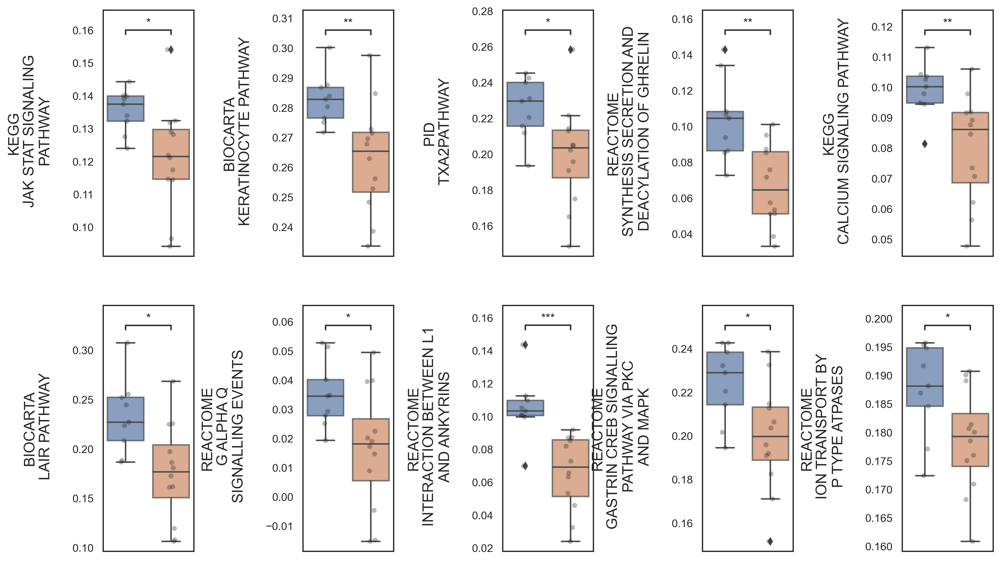

In [31]:
group_name = 'ILC Subtype'
terms = sig_pathways

fig,axes = plt.subplots(ncols=5, nrows=2, figsize=(16,10))
fig.subplots_adjust(hspace=.2, wspace=1.2)

for idx,name in enumerate(terms):
    
    ax = axes.flatten()[idx]
    
    mg[name] = mg[name].astype(float)
 #     sorted_cells = mg[name].median().sort_values(ascending=False).index
    sns.boxplot(data=mg, x=group_name,y=name, ax=ax, boxprops=dict(alpha=.7))
    sns.stripplot(data=mg, x=group_name,y=name, ax=ax, alpha=.3, size=5, jitter=True, color='k')
    ax.set_xlabel(''); ax.set_ylabel('')
    
    title = join_with_linebreaks(name.split('_'))
    ax.set_ylabel(title, fontsize=15)

    ax.set_xticklabels('')#(ax.get_xticklabels(), rotation = 90)

    
    pairs = [('Non-proliferative', 'Proliferative')]
    
    hue_plot_params = {
    'data': mg,
    'x': group_name,
    'y': name
}
    
    annotator = Annotator(ax, pairs, **hue_plot_params)
    annotator.configure(test='Mann-Whitney', text_format='star', loc='inside', comparisons_correction='fdr_bh')
    annotator.apply_and_annotate()
    

In [32]:
genes_hr = pd.read_excel('../data/geneset/rather_ir_hr_pathways_supp8.xlsx',\
                         sheet_name='rather_hr')['name'].tolist()


pathways_sel = [p for p in genes_hr if p in mg.columns]
print(len(pathways_sel))

[p for p in genes_hr if p not in mg.columns]

8


['REACTOME_LOSS_OF_NLP_FROM_MITOTIC_CENTROSOMES']

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.164e-02 U_stat=1.800e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:9.488e-03 U_stat=1.700e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:9.511e-04 U_stat=7.000

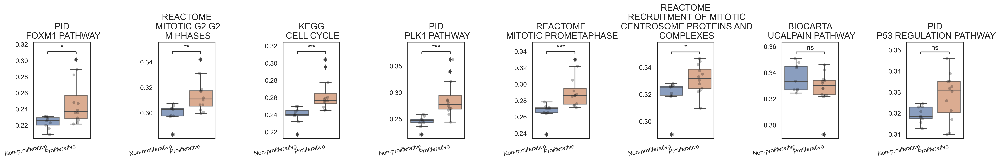

In [33]:
group_name = 'ILC Subtype'
terms = pathways_sel
fig,axes = plt.subplots(ncols=9, nrows=1, figsize=(32,3))


fig.subplots_adjust(hspace=.9, wspace=1.2)

for idx,name in enumerate(terms):
    
    ax = axes.flatten()[idx]
    
    mg[name] = mg[name].astype(float)
 #     sorted_cells = mg[name].median().sort_values(ascending=False).index
    sns.boxplot(data=mg, x=group_name,y=name, ax=ax, boxprops=dict(alpha=.7))
    sns.stripplot(data=mg, x=group_name,y=name, ax=ax, alpha=.3, size=5, jitter=True, color='k')
    ax.set_xlabel(''); ax.set_ylabel('')
    
    title = join_with_linebreaks(name.split('_'))
    ax.set_title(title, fontsize=15, pad=-10)

    ax.set_xticklabels(ax.get_xticklabels(), rotation = 10, ha='right', fontsize=10)

    
    pairs = [('Non-proliferative', 'Proliferative')]
    
    hue_plot_params = {
    'data': mg,
    'x': group_name,
    'y': name
}
    
    annotator = Annotator(ax, pairs, **hue_plot_params)
    annotator.configure(test='Mann-Whitney', text_format='star', loc='inside', comparisons_correction='fdr_bh')
    annotator.apply_and_annotate()
    
for idx in range(8,9):
    fig.delaxes(axes.flatten()[idx])

In [34]:
sig_pathways_idx = [0,1,2,3,4,5] # manual counting from above

sig_pathways = np.array(terms)[sig_pathways_idx]
len(sig_pathways)

6

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.164e-02 U_stat=1.800e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:9.488e-03 U_stat=1.700e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:9.511e-04 U_stat=7.000

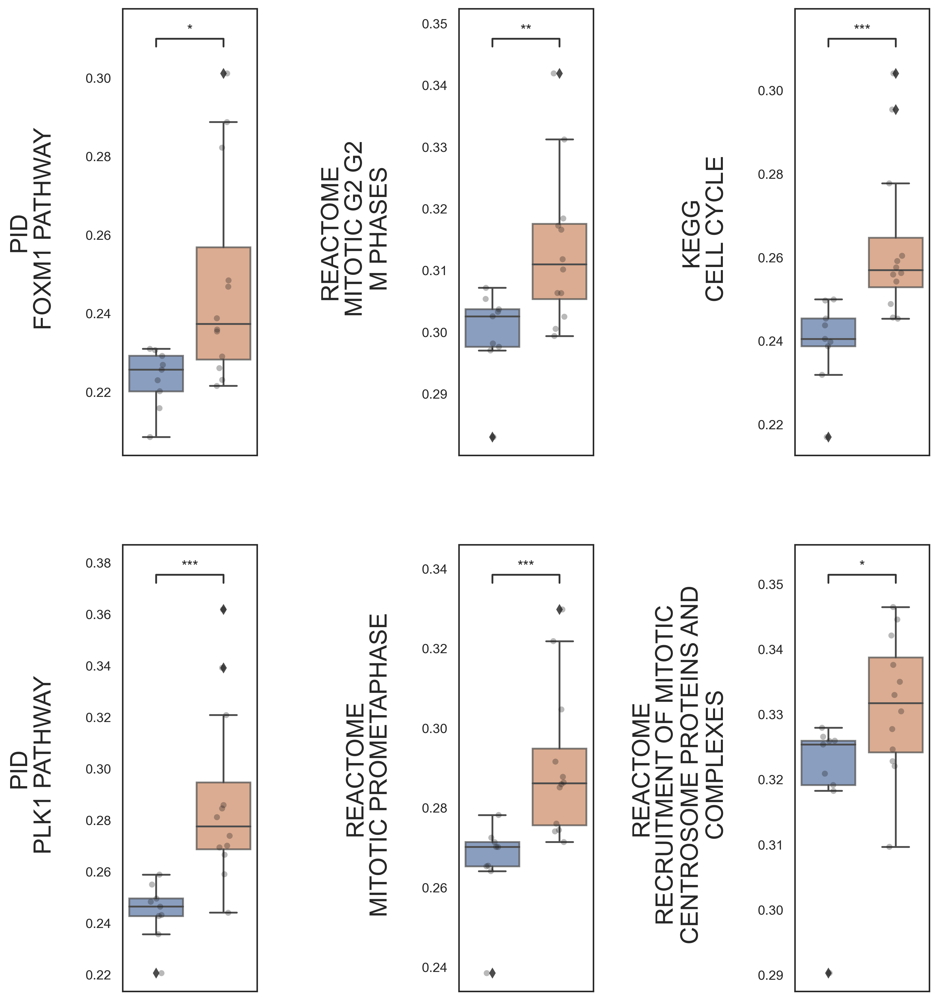

In [35]:
group_name = 'ILC Subtype'
fig,axes = plt.subplots(ncols=3, nrows=2, figsize=(12,15))


fig.subplots_adjust(hspace=.2, wspace=1.5)

for idx,name in enumerate(sig_pathways):
    
    ax = axes.flatten()[idx]
    
    mg[name] = mg[name].astype(float)
 #     sorted_cells = mg[name].median().sort_values(ascending=False).index
    sns.boxplot(data=mg, x=group_name,y=name, ax=ax, boxprops=dict(alpha=.7))
    sns.stripplot(data=mg, x=group_name,y=name, ax=ax, alpha=.3, size=5, jitter=True, color='k')
    ax.set_xlabel(''); ax.set_ylabel('')
    
    title = join_with_linebreaks(name.split('_'))
    ax.set_ylabel(title, fontsize=20)

    ax.set_xticklabels('')#(ax.get_xticklabels(), rotation = 90)

    
    pairs = [('Non-proliferative', 'Proliferative')]
    
    hue_plot_params = {
    'data': mg,
    'x': group_name,
    'y': name
}
    
    annotator = Annotator(ax, pairs, **hue_plot_params)
    annotator.configure(test='Mann-Whitney', text_format='star', loc='inside', comparisons_correction='fdr_bh')
    annotator.apply_and_annotate()

## Plot altogether

In [36]:
dat= pd.read_csv('../data/gex/tpm.csv', index_col=0)

meta = pd.read_csv('../data/classifier/2_class_pam50.csv', index_col=0)
meta['ILC Subtype'] = meta['class_2c']

gsva1 = pd.read_csv('../data/gsva/ILC21pt_MsigdbCanonical.ssgsea.csv', index_col=0)
gsva2 = pd.read_csv('../data/gsva/ILC21pt_MsigdbHallmark.ssgsea.csv', index_col=0)
gsva = pd.concat((gsva1,gsva2))

mg = meta[['ILC Subtype']].join(gsva.T)

mg['REACTOME_CLASS_A1_RHODOPSIN_LIKE_RECEPTORS'] = mg['REACTOME_CLASS_A_1_RHODOPSIN_LIKE_RECEPTORS']
mg['PID_CD8TCRDOWNSTREAMPATHWAY'] = mg['PID_CD8_TCR_DOWNSTREAM_PATHWAY']

mg['REACTOME_DOWNSTREAM_TCR_SIGNALING'] = mg['REACTOME_TCR_SIGNALING']
mg['PID_CD8TCRPATHWAY'] = mg['PID_CD8_TCR_PATHWAY']
mg['PID_IL12_STAT4PATHWAY'] = mg['PID_IL12_STAT4_PATHWAY']

mg['PID_FOXM1PATHWAY'] = mg['PID_FOXM1_PATHWAY']
mg['PID_P53REGULATIONPATHWAY'] = mg['PID_P53_REGULATION_PATHWAY']

mg

,ILC Subtype,BIOCARTA_GRANULOCYTES_PATHWAY,BIOCARTA_LYM_PATHWAY,BIOCARTA_BLYMPHOCYTE_PATHWAY,BIOCARTA_CARM_ER_PATHWAY,BIOCARTA_LAIR_PATHWAY,BIOCARTA_VDR_PATHWAY,BIOCARTA_MTA3_PATHWAY,BIOCARTA_GABA_PATHWAY,BIOCARTA_EGFR_SMRTE_PATHWAY,...,HALLMARK_KRAS_SIGNALING_UP,HALLMARK_KRAS_SIGNALING_DN,HALLMARK_PANCREAS_BETA_CELLS,REACTOME_CLASS_A1_RHODOPSIN_LIKE_RECEPTORS,PID_CD8TCRDOWNSTREAMPATHWAY,REACTOME_DOWNSTREAM_TCR_SIGNALING,PID_CD8TCRPATHWAY,PID_IL12_STAT4PATHWAY,PID_FOXM1PATHWAY,PID_P53REGULATIONPATHWAY
TP17_M605,Non-proliferative,0.105709,0.201361,0.229485,0.322296,0.223413,0.415255,0.321525,0.087937,0.371562,...,0.431167,0.041274,0.051316,-0.051269,0.158881,0.336965,0.252353,0.239683,0.208491,0.317407
TP18_M403,Non-proliferative,0.158115,0.197585,0.272626,0.307355,0.251981,0.414894,0.294547,0.088308,0.325282,...,0.435391,-0.022970,0.002552,-0.097710,0.146047,0.337060,0.252138,0.232879,0.230948,0.315489
TP17_M383,Proliferative,0.047790,0.121971,0.179275,0.327442,0.160877,0.416166,0.357738,0.063759,0.358433,...,0.331939,-0.015762,-0.087339,-0.118902,0.094999,0.302421,0.189286,0.171864,0.238743,0.309915
TP18_M202,Non-proliferative,0.121063,0.183995,0.248004,0.329612,0.227004,0.420502,0.343717,0.065195,0.336189,...,0.415925,0.017895,0.014078,-0.086040,0.141656,0.323632,0.234890,0.214449,0.226878,0.320792
TP18_M355,Non-proliferative,0.110070,0.164807,0.226275,0.318447,0.188229,0.417500,0.328942,0.072569,0.341769,...,0.401337,0.006118,0.030719,-0.087533,0.127941,0.327459,0.219748,0.209206,0.215843,0.323007
TP17_M510,Proliferative,0.112719,0.170517,0.243943,0.320848,0.197047,0.422020,0.332552,0.103500,0.284852,...,0.373364,-0.013642,-0.052813,-0.103302,0.141764,0.329925,0.228874,0.235674,0.246781,0.331734
TP17_M802,Proliferative,0.087186,0.128854,0.186085,0.326826,0.172486,0.421001,0.316812,0.056484,0.262952,...,0.326083,-0.024941,-0.026518,-0.095767,0.130501,0.323150,0.216243,0.198453,0.228997,0.332544
TP17_M882,Proliferative,0.132996,0.163143,0.217968,0.331556,0.186089,0.408548,0.322192,0.082574,0.246882,...,0.346193,-0.044131,-0.010614,-0.093592,0.118707,0.327438,0.219484,0.201522,0.282185,0.335193
TP18_M329,Proliferative,0.180602,0.240962,0.282745,0.330337,0.268369,0.423710,0.343662,0.086953,0.338153,...,0.433881,0.010645,-0.020467,-0.065225,0.183708,0.356369,0.291687,0.273737,0.235869,0.330247
TP17_M378,Proliferative,0.046127,0.092737,0.143876,0.322369,0.119263,0.418575,0.356657,0.077961,0.293800,...,0.272911,-0.030010,-0.029601,-0.125393,0.091431,0.309116,0.178957,0.165686,0.301098,0.345917


In [37]:
# enriched pathways in RATHER immune related subtype
genes_ir = pd.read_excel('../data/geneset/rather_ir_hr_pathways_supp8.xlsx',\
                         sheet_name='rather_ir')['name'].tolist()

pathways_sel = [x for x in genes_ir if x in mg.columns]

sig_pathways_idx = [2,12,13,18,19,24,32,33,40,41] # manual counting pathways showing significant difference from above

sig_pathways_ir = np.array(pathways_sel)[sig_pathways_idx]
print(len(sig_pathways_ir), sig_pathways_ir, '\n')

# hormone related pathways in RATHER hormone related subtype
genes_hr = pd.read_excel('../data/geneset/rather_ir_hr_pathways_supp8.xlsx',\
                         sheet_name='rather_hr')['name'].tolist()

pathways_sel = [p for p in genes_hr if p in mg.columns]
sig_pathways_idx = [0,1,2,3,4,5] # manual counting from above

sig_pathways_hr = np.array(pathways_sel)[sig_pathways_idx]
print(len(sig_pathways_hr), sig_pathways_hr)

10 ['KEGG_JAK_STAT_SIGNALING_PATHWAY' 'BIOCARTA_KERATINOCYTE_PATHWAY'
 'PID_TXA2PATHWAY'
 'REACTOME_SYNTHESIS_SECRETION_AND_DEACYLATION_OF_GHRELIN'
 'KEGG_CALCIUM_SIGNALING_PATHWAY' 'BIOCARTA_LAIR_PATHWAY'
 'REACTOME_G_ALPHA_Q_SIGNALLING_EVENTS'
 'REACTOME_INTERACTION_BETWEEN_L1_AND_ANKYRINS'
 'REACTOME_GASTRIN_CREB_SIGNALLING_PATHWAY_VIA_PKC_AND_MAPK'
 'REACTOME_ION_TRANSPORT_BY_P_TYPE_ATPASES'] 

6 ['PID_FOXM1_PATHWAY' 'REACTOME_MITOTIC_G2_G2_M_PHASES' 'KEGG_CELL_CYCLE'
 'PID_PLK1_PATHWAY' 'REACTOME_MITOTIC_PROMETAPHASE'
 'REACTOME_RECRUITMENT_OF_MITOTIC_CENTROSOME_PROTEINS_AND_COMPLEXES']


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.164e-02 U_stat=9.000e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:6.218e-03 U_stat=9.300e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non-proliferative vs. Proliferative: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:2.091e-02 U_stat=8.700

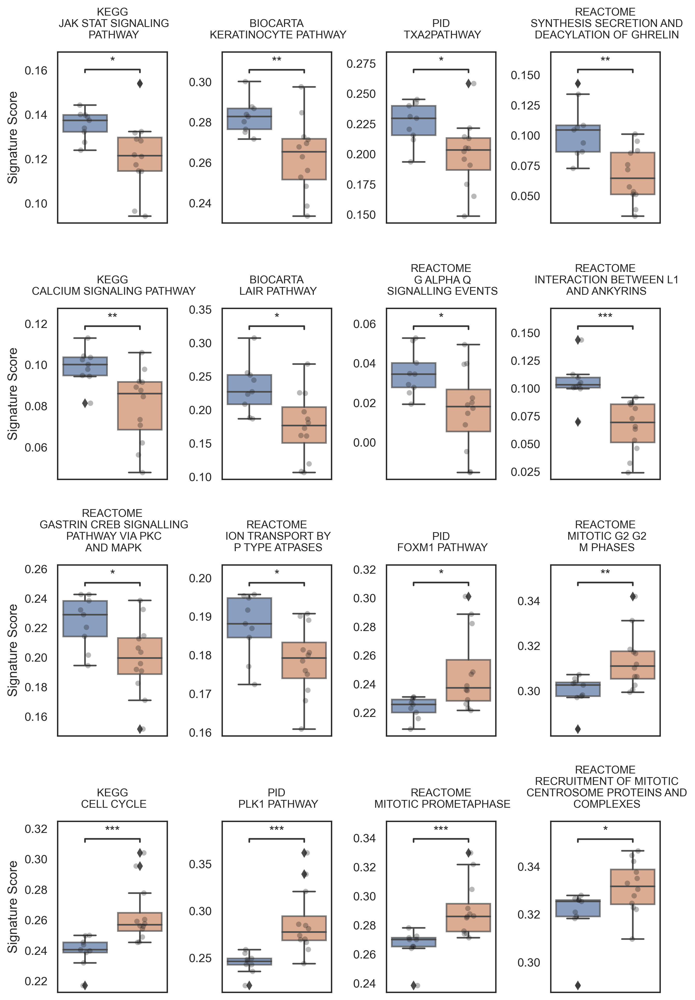

In [40]:
sns.set(style='white', font_scale=1)
plt.rcParams['figure.dpi'] = 300  # set default dpi to 300

group_name = 'ILC Subtype'
fig,axes = plt.subplots(ncols=4, nrows=4, figsize=(10,16))


fig.subplots_adjust(hspace=.5, wspace=.5)

for idx,name in enumerate(np.hstack((sig_pathways_ir, sig_pathways_hr))):
    
    ax = axes.flatten()[idx]
    
    mg[name] = mg[name].astype(float)
 #     sorted_cells = mg[name].median().sort_values(ascending=False).index
    sns.boxplot(data=mg, x=group_name,y=name, ax=ax, boxprops=dict(alpha=.7))
    sns.stripplot(data=mg, x=group_name,y=name, ax=ax, alpha=.3, size=5, jitter=True, color='k')
    ax.set_xlabel(''); ax.set_ylabel('')
    
    title = join_with_linebreaks(name.split('_'))
    ax.set_title(title, fontsize=10, pad=-20)

    ax.set_xticklabels('')#(ax.get_xticklabels(), rotation = 90)
    if idx%4 == 0:
        ax.set_ylabel('Signature Score')

    
    pairs = [('Non-proliferative', 'Proliferative')]
    
    hue_plot_params = {
    'data': mg,
    'x': group_name,
    'y': name
}
    
    annotator = Annotator(ax, pairs, **hue_plot_params)
    annotator.configure(test='Mann-Whitney', text_format='star', loc='inside', comparisons_correction='fdr_bh')
    annotator.apply_and_annotate()

# Export

In [ ]:
! rm ../images/Figure1/*
! junix -f "Fig1. ILC Tumor Clusters.ipynb" -o ../images/Figure1